In [1]:
import yfinance as yf
import pandas as pd

# List of tickers
tickers = ['ENPH', 'NEE', 'IBDRY', 'VWDRY', 'DNNGY', 'FSLR', 'RUN', 'PLUG', 'BE', 'ORA', 'SEDG', 'SPWR', 'BLDP', 'CSIQ']

# Empty DataFrame to store the historical data
stock_df = pd.DataFrame()

for ticker in tickers:
    try:
        data = yf.download(ticker, start="2018-01-01", end="2023-12-31")
        if data.empty:
            print(f"No data for {ticker} during the selected period.")
            continue
        data['Ticker'] = ticker 
        stock_df = pd.concat([stock_df, data], axis=0)  # Appending the data to the main dataframe
    except Exception as e:
        print(f"Error downloading data for {ticker}: {str(e)}")

stock_df.reset_index(inplace=True)

print(stock_df.head())


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
        Date  Open  High   Low  Cl

In [8]:
# Group the DataFrame by 'Ticker' and calculate the percentage change in 'Adj Close' for each stock
stock_df['Return'] = stock_df.groupby('Ticker')['Adj Close'].pct_change()

# Create a new DataFrame for returns
df_returns = stock_df[['Date', 'Ticker', 'Return']].dropna()

print(df_returns.head())


        Date Ticker    Return
1 2018-01-03   ENPH -0.007692
2 2018-01-04   ENPH -0.031008
3 2018-01-05   ENPH -0.012000
4 2018-01-08   ENPH -0.024291
5 2018-01-09   ENPH -0.012448


In [9]:
df_returns


,Date,Ticker,Return
1,2018-01-03,ENPH,-0.007692
2,2018-01-04,ENPH,-0.031008
3,2018-01-05,ENPH,-0.012000
4,2018-01-08,ENPH,-0.024291
5,2018-01-09,ENPH,-0.012448
...,...,...,...
19342,2023-07-10,CSIQ,0.042888
19343,2023-07-11,CSIQ,-0.027850
19344,2023-07-12,CSIQ,0.029987
19345,2023-07-13,CSIQ,-0.005979


In [10]:
df_vix = pd.read_csv('VIX_History.csv')

In [11]:
df_vix

,DATE,OPEN,HIGH,LOW,CLOSE
0,01/02/1990,17.24,17.24,17.24,17.24
1,01/03/1990,18.19,18.19,18.19,18.19
2,01/04/1990,19.22,19.22,19.22,19.22
3,01/05/1990,20.11,20.11,20.11,20.11
4,01/08/1990,20.26,20.26,20.26,20.26
...,...,...,...,...,...
8447,07/06/2023,14.85,17.08,14.79,15.44
8448,07/07/2023,15.97,16.06,14.33,14.83
8449,07/10/2023,16.08,16.21,15.04,15.07
8450,07/11/2023,15.02,15.25,14.63,14.84


In [12]:
# Convert the 'DATE' column to datetime
df_vix['DATE'] = pd.to_datetime(df_vix['DATE'], format='%m/%d/%Y')

# Rename the columns
df_vix.rename(columns={
    'DATE': 'Date',
    'OPEN': 'VIX_OPEN',
    'HIGH': 'VIX_HIGH',
    'LOW': 'VIX_LOW',
    'CLOSE': 'VIX_CLOSE'
}, inplace=True)

# Merge the two DataFrames
merged_df = pd.merge(df_returns, df_vix, on='Date', how='inner')

print(merged_df.head())


        Date Ticker    Return  VIX_OPEN  VIX_HIGH  VIX_LOW  VIX_CLOSE
0 2018-01-03   ENPH -0.007692      9.56      9.65     8.94       9.15
1 2018-01-03    NEE -0.021213      9.56      9.65     8.94       9.15
2 2018-01-03  IBDRY -0.000970      9.56      9.65     8.94       9.15
3 2018-01-03  VWDRY -0.018029      9.56      9.65     8.94       9.15
4 2018-01-03  DNNGY  0.000000      9.56      9.65     8.94       9.15


In [13]:
merged_df

,Date,Ticker,Return,VIX_OPEN,VIX_HIGH,VIX_LOW,VIX_CLOSE
0,2018-01-03,ENPH,-0.007692,9.56,9.65,8.94,9.15
1,2018-01-03,NEE,-0.021213,9.56,9.65,8.94,9.15
2,2018-01-03,IBDRY,-0.000970,9.56,9.65,8.94,9.15
3,2018-01-03,VWDRY,-0.018029,9.56,9.65,8.94,9.15
4,2018-01-03,DNNGY,0.000000,9.56,9.65,8.94,9.15
...,...,...,...,...,...,...,...
19300,2023-07-12,ORA,0.020381,14.82,14.82,13.51,13.54
19301,2023-07-12,SEDG,0.022147,14.82,14.82,13.51,13.54
19302,2023-07-12,SPWR,0.081933,14.82,14.82,13.51,13.54
19303,2023-07-12,BLDP,-0.026258,14.82,14.82,13.51,13.54


In [14]:
df_nasdaq = pd.read_csv("NASDAQ.csv")

In [15]:
df_nasdaq

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-01-14,6908.029785,6936.220215,6887.479980,6905.919922,6905.919922,1960780000
1,2019-01-15,6931.390137,7025.850098,6928.120117,7023.830078,7023.830078,2066090000
2,2019-01-16,7033.750000,7079.629883,7028.120117,7034.689941,7034.689941,2163730000
3,2019-01-17,7010.129883,7113.950195,7003.620117,7084.459961,7084.459961,2149280000
4,2019-01-18,7134.100098,7185.379883,7096.620117,7157.229980,7157.229980,2459920000
...,...,...,...,...,...,...,...
1127,2023-07-07,13668.070313,13804.509766,13656.730469,13660.719727,13660.719727,5098120000
1128,2023-07-10,13645.370117,13692.410156,13584.870117,13685.480469,13685.480469,5275390000
1129,2023-07-11,13709.809570,13774.830078,13643.320313,13760.700195,13760.700195,4840950000
1130,2023-07-12,13915.639648,13963.450195,13842.129883,13918.959961,13918.959961,5230620000


In [16]:
df_nasdaq['Date'] = pd.to_datetime(df_nasdaq['Date'])

df_nasdaq = df_nasdaq[['Date', 'Adj Close']]

df_nasdaq.rename(columns={'Adj Close': 'NASDAQ_Close'}, inplace=True)

merged_df = pd.merge(merged_df, df_nasdaq, on='Date', how='inner')

print(merged_df.head())


        Date Ticker    Return  VIX_OPEN  VIX_HIGH  VIX_LOW  VIX_CLOSE  \
0 2019-01-14   ENPH  0.024648     19.96     19.99     18.7      19.07   
1 2019-01-14    NEE -0.025497     19.96     19.99     18.7      19.07   
2 2019-01-14  IBDRY -0.002522     19.96     19.99     18.7      19.07   
3 2019-01-14  VWDRY -0.008139     19.96     19.99     18.7      19.07   
4 2019-01-14  DNNGY -0.025552     19.96     19.99     18.7      19.07   

   NASDAQ_Close  
0   6905.919922  
1   6905.919922  
2   6905.919922  
3   6905.919922  
4   6905.919922  


C:\Users\subhan\AppData\Local\Temp\ipykernel_104752\2491118498.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nasdaq.rename(columns={'Adj Close': 'NASDAQ_Close'}, inplace=True)


In [17]:
merged_df.rename(columns={'Adj Close': 'NASDAQ'}, inplace=True)


In [18]:
merged_df

,Date,Ticker,Return,VIX_OPEN,VIX_HIGH,VIX_LOW,VIX_CLOSE,NASDAQ_Close
0,2019-01-14,ENPH,0.024648,19.96,19.99,18.70,19.07,6905.919922
1,2019-01-14,NEE,-0.025497,19.96,19.99,18.70,19.07,6905.919922
2,2019-01-14,IBDRY,-0.002522,19.96,19.99,18.70,19.07,6905.919922
3,2019-01-14,VWDRY,-0.008139,19.96,19.99,18.70,19.07,6905.919922
4,2019-01-14,DNNGY,-0.025552,19.96,19.99,18.70,19.07,6905.919922
...,...,...,...,...,...,...,...,...
15829,2023-07-12,ORA,0.020381,14.82,14.82,13.51,13.54,13918.959961
15830,2023-07-12,SEDG,0.022147,14.82,14.82,13.51,13.54,13918.959961
15831,2023-07-12,SPWR,0.081933,14.82,14.82,13.51,13.54,13918.959961
15832,2023-07-12,BLDP,-0.026258,14.82,14.82,13.51,13.54,13918.959961


In [19]:
import yfinance as yf

sp500_df = yf.download('^GSPC', start='2019-01-01', end='2023-07-09')

# We will use 'Adj Close' for simplicity
sp500_df = sp500_df[['Adj Close']].reset_index()
sp500_df.columns = ['Date', 'S&P500']

[*********************100%***********************]  1 of 1 completed


In [20]:
sp500_df

,Date,S&P500
0,2019-01-02,2510.030029
1,2019-01-03,2447.889893
2,2019-01-04,2531.939941
3,2019-01-07,2549.689941
4,2019-01-08,2574.409912
...,...,...
1131,2023-06-30,4450.379883
1132,2023-07-03,4455.589844
1133,2023-07-05,4446.819824
1134,2023-07-06,4411.589844


In [21]:
sp500_df['Date'] = pd.to_datetime(sp500_df['Date'])

merged_df = pd.merge(merged_df, sp500_df, on='Date', how='inner')

print(merged_df.head())


        Date Ticker    Return  VIX_OPEN  VIX_HIGH  VIX_LOW  VIX_CLOSE  \
0 2019-01-14   ENPH  0.024648     19.96     19.99     18.7      19.07   
1 2019-01-14    NEE -0.025497     19.96     19.99     18.7      19.07   
2 2019-01-14  IBDRY -0.002522     19.96     19.99     18.7      19.07   
3 2019-01-14  VWDRY -0.008139     19.96     19.99     18.7      19.07   
4 2019-01-14  DNNGY -0.025552     19.96     19.99     18.7      19.07   

   NASDAQ_Close       S&P500  
0   6905.919922  2582.610107  
1   6905.919922  2582.610107  
2   6905.919922  2582.610107  
3   6905.919922  2582.610107  
4   6905.919922  2582.610107  


In [22]:
merged_df

,Date,Ticker,Return,VIX_OPEN,VIX_HIGH,VIX_LOW,VIX_CLOSE,NASDAQ_Close,S&P500
0,2019-01-14,ENPH,0.024648,19.96,19.99,18.70,19.07,6905.919922,2582.610107
1,2019-01-14,NEE,-0.025497,19.96,19.99,18.70,19.07,6905.919922,2582.610107
2,2019-01-14,IBDRY,-0.002522,19.96,19.99,18.70,19.07,6905.919922,2582.610107
3,2019-01-14,VWDRY,-0.008139,19.96,19.99,18.70,19.07,6905.919922,2582.610107
4,2019-01-14,DNNGY,-0.025552,19.96,19.99,18.70,19.07,6905.919922,2582.610107
...,...,...,...,...,...,...,...,...,...
15787,2023-07-07,ORA,0.009450,15.97,16.06,14.33,14.83,13660.719727,4398.950195
15788,2023-07-07,SEDG,0.015133,15.97,16.06,14.33,14.83,13660.719727,4398.950195
15789,2023-07-07,SPWR,-0.006557,15.97,16.06,14.33,14.83,13660.719727,4398.950195
15790,2023-07-07,BLDP,0.007407,15.97,16.06,14.33,14.83,13660.719727,4398.950195


In [24]:
features_dict = {
    "BE": [],
    "BLDP": [],
    "CSIQ": [],
    "DNNGY": [],
    "ENPH": [],
    "FSLR": [],
    "IBDRY": [],
    "NEE": [],
    "ORA": [],
    "PLUG": [],
    "RUN": [],
    "SEDG": [],
    "SPWR": [],
    "VWDRY": []
}

In [25]:
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_data = merged_df[merged_df['Ticker'] == ticker][['Return'] + features]

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_data))
    train_df = ticker_data.iloc[:train_size]
    test_df = ticker_data.iloc[train_size:]

    # Normalize the data
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker], index=test_df.index[lookback:])
    predicted_df = pd.DataFrame(predictions, columns=[ticker], index=test_df.index[lookback:])

    actual_df.to_csv(f'{ticker}_actual.csv')
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')


7/7 [==============================] - 0s 3ms/step
MSE for ENPH: 0.0014513238585181195
7/7 [==============================] - 0s 5ms/step
MSE for NEE: 0.00028853165066936693
7/7 [==============================] - 0s 5ms/step
MSE for IBDRY: 0.00018371477834308017
7/7 [==============================] - 1s 5ms/step
MSE for VWDRY: 0.0006897131723581139
7/7 [==============================] - 0s 6ms/step
MSE for DNNGY: 0.0006398820617098137
7/7 [==============================] - 1s 5ms/step
MSE for FSLR: 0.0012480796636227985
7/7 [==============================] - 1s 6ms/step
MSE for RUN: 0.0024757481644380763
7/7 [==============================] - 2s 7ms/step
MSE for PLUG: 0.0021074342157323717
7/7 [==============================] - 1s 8ms/step
MSE for BE: 0.0015935027237152402
7/7 [==============================] - 1s 10ms/step
MSE for ORA: 0.00039769487870266557
7/7 [==============================] - 1s 8ms/step
MSE for SEDG: 0.0014232833255766293
7/7 [==============================] - 1s

In [44]:
from sklearn.ensemble import RandomForestRegressor

# Define the list of features you want to examine
features = ['VIX_OPEN', 'VIX_HIGH', 'VIX_LOW', 'VIX_CLOSE', 'NASDAQ_Close', 'S&P500']

# A dictionary to store feature importance of each ticker
feature_imp_dict = {}

# For each ticker
for ticker in tickers:
    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Split the data into inputs and targets
    X_train = train_df.drop('Return', axis=1)
    y_train = train_df['Return']

    # Define a Random Forest model
    model = RandomForestRegressor(n_estimators=100)

    # Fit the model
    model.fit(X_train, y_train)

    # Get feature importance
    feature_imp_dict[ticker] = model.feature_importances_

# Print feature importance
for ticker, imp in feature_imp_dict.items():
    print(f'Feature importance for {ticker}:')
    for feature, importance in zip(features, imp):
        print(f'{feature}: {importance}')


Feature importance for ENPH:
VIX_OPEN: 0.19134971645682827
VIX_HIGH: 0.14564538976199107
VIX_LOW: 0.13375004055371756
VIX_CLOSE: 0.22862196256670608
NASDAQ_Close: 0.1429976755154193
S&P500: 0.15763521514533785
Feature importance for NEE:
VIX_OPEN: 0.22390548963947723
VIX_HIGH: 0.12978070027403463
VIX_LOW: 0.12768083955065293
VIX_CLOSE: 0.2323640357874418
NASDAQ_Close: 0.12351715763050718
S&P500: 0.16275177711788633
Feature importance for IBDRY:
VIX_OPEN: 0.19347112189622806
VIX_HIGH: 0.1708891320931479
VIX_LOW: 0.1253002345766597
VIX_CLOSE: 0.26693212184409415
NASDAQ_Close: 0.11467089264180924
S&P500: 0.12873649694806094
Feature importance for VWDRY:
VIX_OPEN: 0.17935626855596495
VIX_HIGH: 0.15264560310366812
VIX_LOW: 0.13370130401887706
VIX_CLOSE: 0.1939997335578025
NASDAQ_Close: 0.17971286029368025
S&P500: 0.16058423047000703
Feature importance for DNNGY:
VIX_OPEN: 0.18369200137645098
VIX_HIGH: 0.1650021771991815
VIX_LOW: 0.1222966803814698
VIX_CLOSE: 0.2073611495516461
NASDAQ_Close:

In [36]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Convert 'Date' to datetime
merged_df['Date'] = pd.to_datetime(merged_df['Date'])

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Return'] + features]

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')
    


7/7 [==============================] - 0s 6ms/step
MSE for ENPH: 0.001548410524150832
7/7 [==============================] - 0s 6ms/step
MSE for NEE: 0.0003110208220531149
7/7 [==============================] - 1s 6ms/step
MSE for IBDRY: 0.0001816005318661754
7/7 [==============================] - 0s 5ms/step
MSE for VWDRY: 0.0006894510811971539
7/7 [==============================] - 1s 9ms/step
MSE for DNNGY: 0.0006831129599433076
7/7 [==============================] - 1s 6ms/step
MSE for FSLR: 0.0012341192838068202
7/7 [==============================] - 1s 6ms/step
MSE for RUN: 0.002484255694544998
7/7 [==============================] - 1s 7ms/step
MSE for PLUG: 0.002012242230531097
7/7 [==============================] - 1s 7ms/step
MSE for BE: 0.0015767794065626953
7/7 [==============================] - 0s 7ms/step
MSE for ORA: 0.00039584654315671095
7/7 [==============================] - 0s 7ms/step
MSE for SEDG: 0.00149136711624786
7/7 [==============================] - 1s 8ms/ste

In [37]:
def plot_predictions2(ticker):
    actual_df = pd.read_csv(f'{ticker}_actual.csv', index_col='Date', parse_dates=True)
    predicted_df = pd.read_csv(f'{ticker}_predicted.csv', index_col='Date', parse_dates=True)

    # Compute the cumulative product of returns
    actual_df[ticker] = (1 + actual_df[ticker]).cumprod()
    predicted_df[ticker] = (1 + predicted_df[ticker]).cumprod()

    plt.figure(figsize=(10,6))
    plt.plot(actual_df.index, actual_df[ticker], label='Actual Price')
    plt.plot(predicted_df.index, predicted_df[ticker], label='Predicted Price')
    plt.title(f'Actual vs Predicted Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()


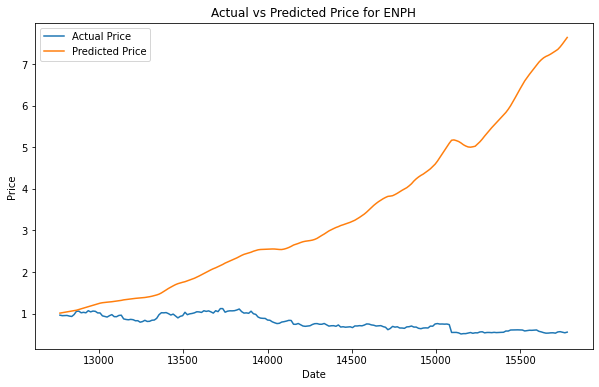

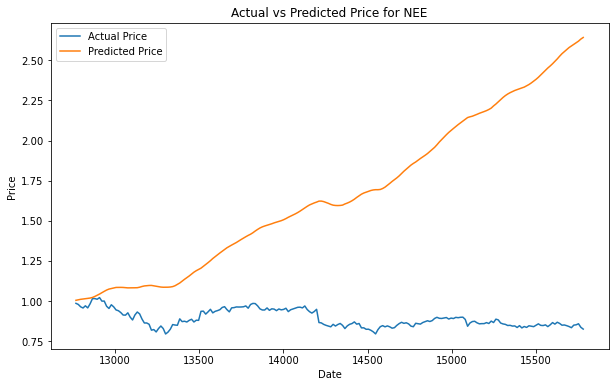

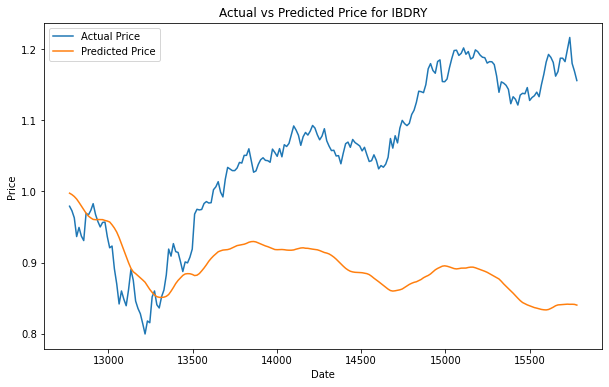

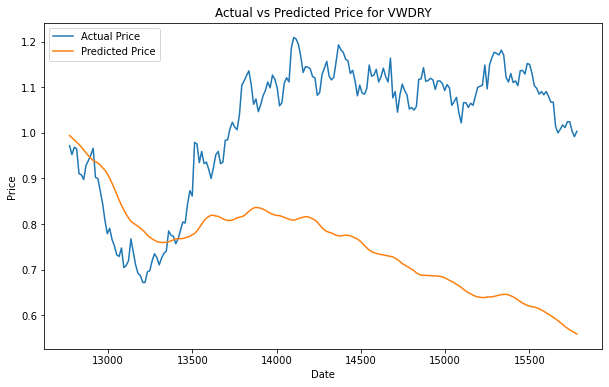

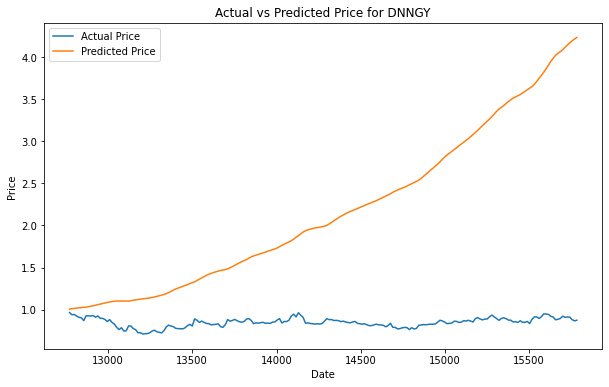

...

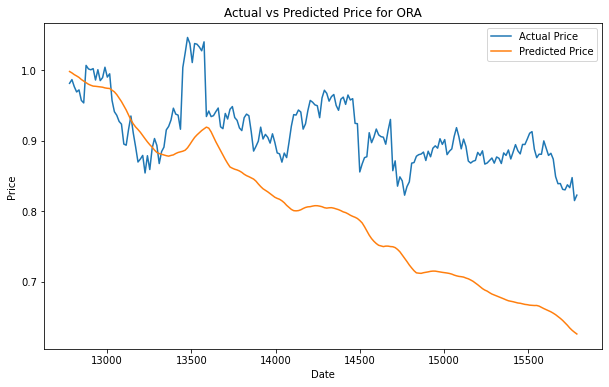

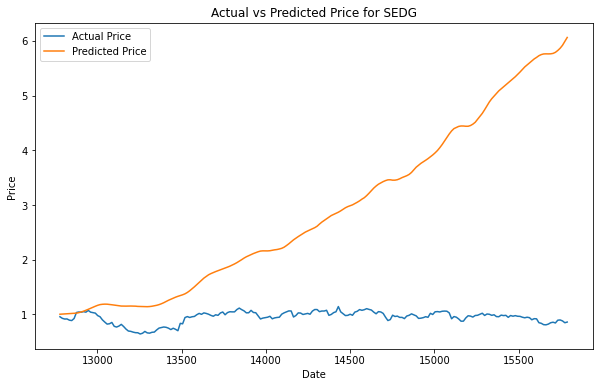

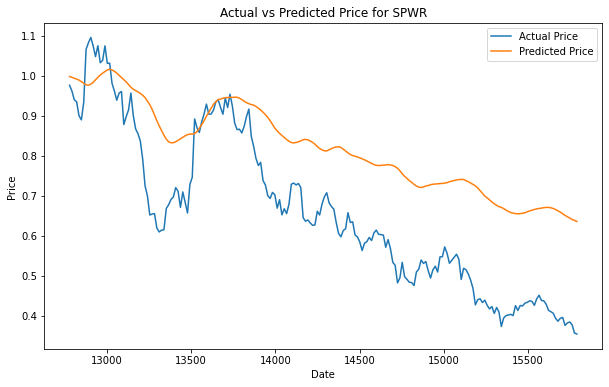

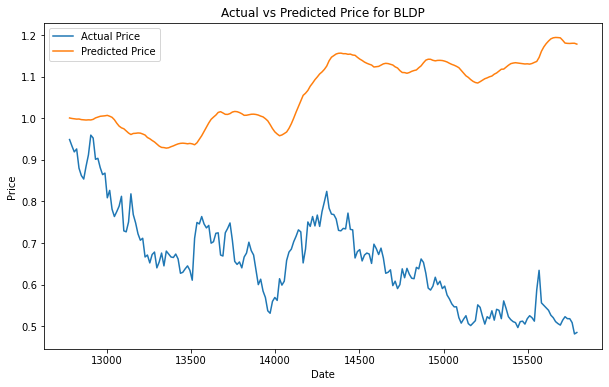

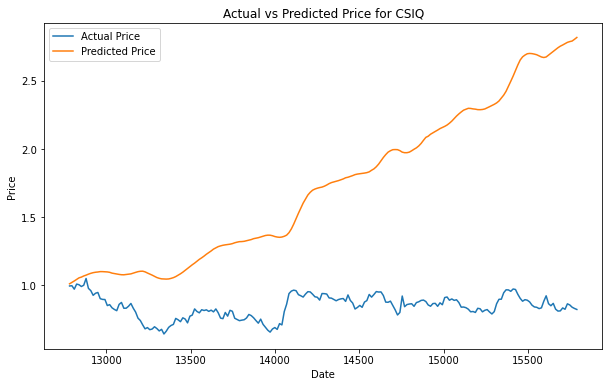

In [38]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')



In [41]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

def plot_predictions2(ticker):
    actual_df = pd.read_csv(f'{ticker}_actual.csv', index_col='Date', parse_dates=True)
    predicted_df = pd.read_csv(f'{ticker}_predicted.csv', index_col='Date', parse_dates=True)

    # Compute the cumulative product of returns
    actual_df[ticker] = (1 + actual_df[ticker]).cumprod()
    predicted_df[ticker] = (1 + predicted_df[ticker]).cumprod()

    plt.figure(figsize=(10,6))
    plt.plot(actual_df.index, actual_df[ticker], label='Actual Price')
    plt.plot(predicted_df.index, predicted_df[ticker], label='Predicted Price')
    plt.title(f'Actual vs Predicted Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()



7/7 [==============================] - 0s 6ms/step
MSE for ENPH: 0.0016474050389013342
7/7 [==============================] - 1s 6ms/step
MSE for NEE: 0.00027974830899329804
7/7 [==============================] - 1s 6ms/step
MSE for IBDRY: 0.00018057416824881668
7/7 [==============================] - 1s 8ms/step
MSE for VWDRY: 0.0007271958539847493
7/7 [==============================] - 1s 4ms/step
MSE for DNNGY: 0.0006356785323141656
7/7 [==============================] - 0s 5ms/step
MSE for FSLR: 0.0012245530541247444
7/7 [==============================] - 1s 5ms/step
MSE for RUN: 0.0025954063171840956
7/7 [==============================] - 1s 8ms/step
MSE for PLUG: 0.0020529360278296834
7/7 [==============================] - 1s 6ms/step
MSE for BE: 0.0016177137780413672
7/7 [==============================] - 0s 6ms/step
MSE for ORA: 0.00041200537136097264
7/7 [==============================] - 1s 7ms/step
MSE for SEDG: 0.001421069832160338
7/7 [==============================] - 0s 4

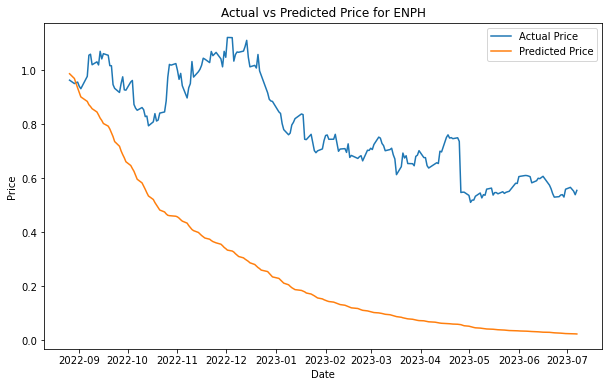

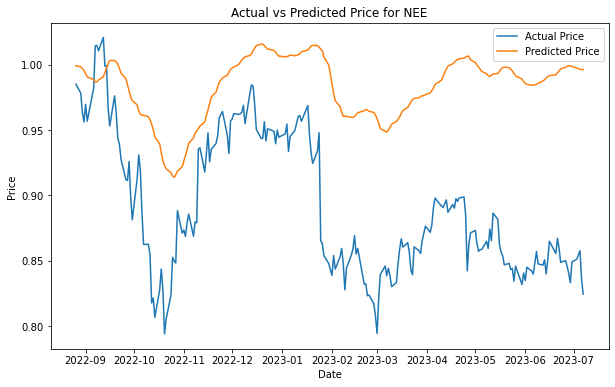

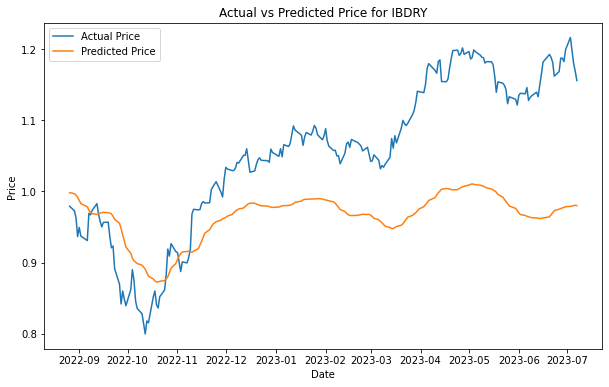

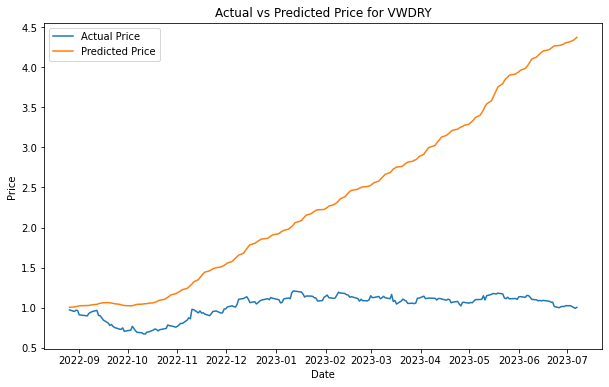

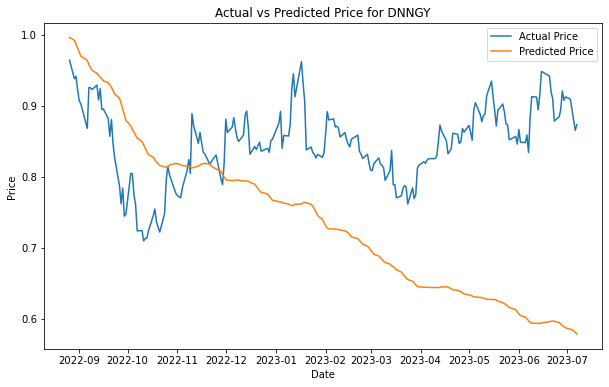

...

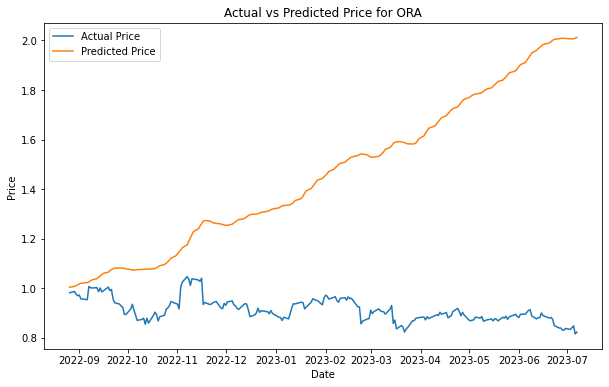

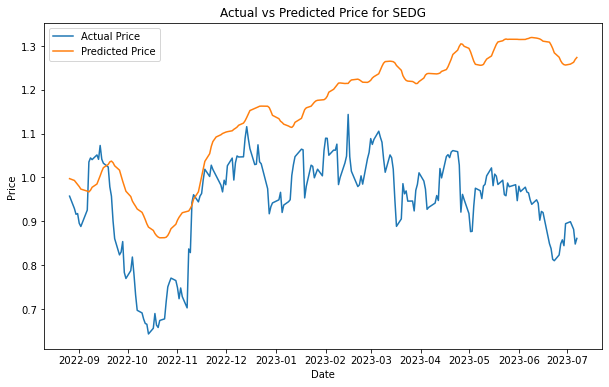

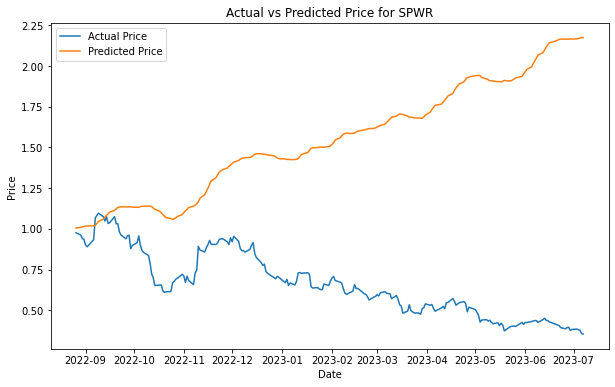

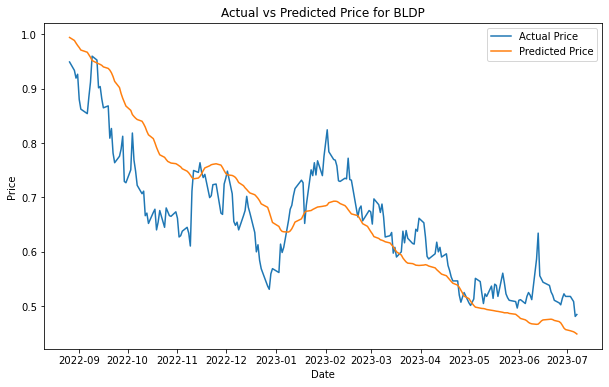

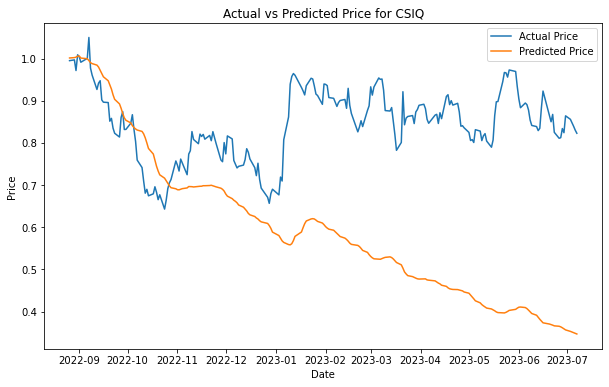

In [42]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [45]:
features_dict = {
    "BE": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "BLDP": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "CSIQ": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "DNNGY": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "ENPH": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "FSLR": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "IBDRY": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "NEE": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "ORA": ["VIX_OPEN", "VIX_CLOSE", "VIX_LOW", "VIX_HIGH", "NASDAQ_Close"],
    "PLUG": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "RUN": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "SEDG": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "SPWR": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "VWDRY": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"]
}


In [46]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 0s 4ms/step
MSE for ENPH: 0.0019162685584526982
7/7 [==============================] - 1s 11ms/step
MSE for NEE: 0.00028005486622733537
7/7 [==============================] - 1s 13ms/step
MSE for IBDRY: 0.00017553341323031478
7/7 [==============================] - 1s 17ms/step
MSE for VWDRY: 0.0006829312797218576
7/7 [==============================] - 0s 10ms/step
MSE for DNNGY: 0.0006785590373959954
7/7 [==============================] - 0s 9ms/step
MSE for FSLR: 0.001209737886440089
7/7 [==============================] - 1s 10ms/step
MSE for RUN: 0.0025702121567278986
7/7 [==============================] - 0s 9ms/step
MSE for PLUG: 0.002089444171703787
7/7 [==============================] - 0s 6ms/step
MSE for BE: 0.002083303868163654
7/7 [==============================] - 0s 8ms/step
MSE for ORA: 0.0003978989417847077
7/7 [==============================] - 0s 9ms/step
MSE for SEDG: 0.0015739081361599873
7/7 [==============================] - 1s

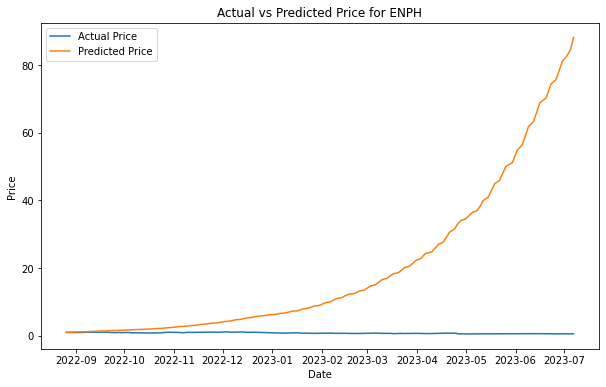

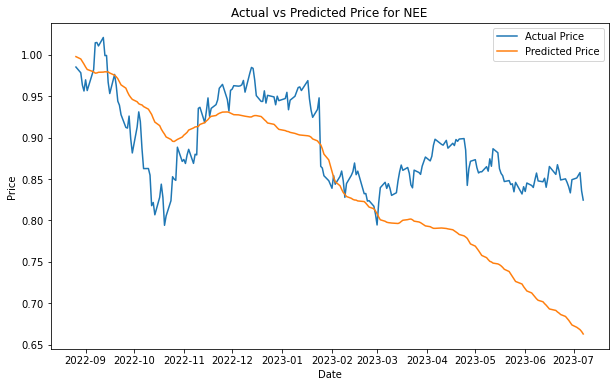

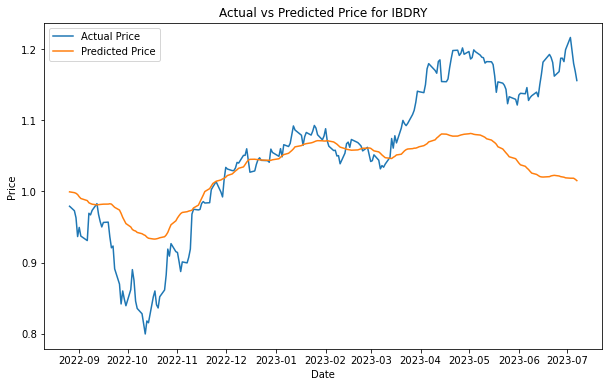

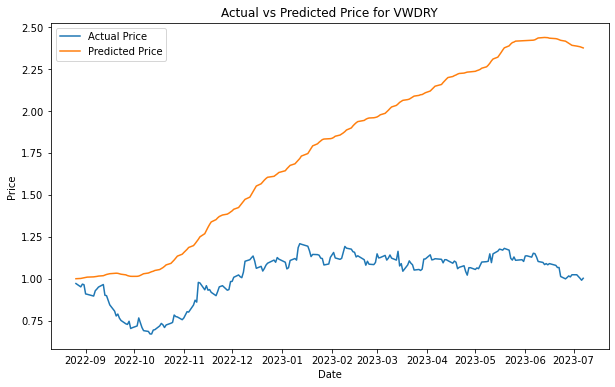

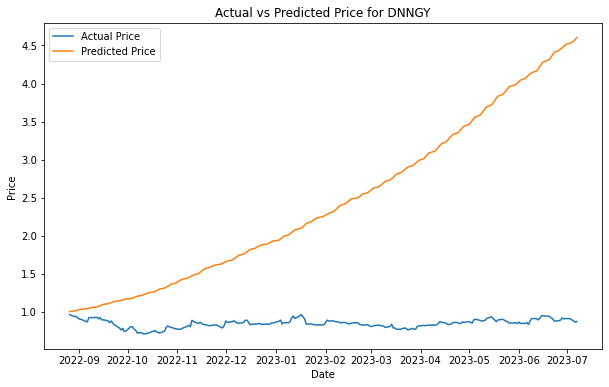

...

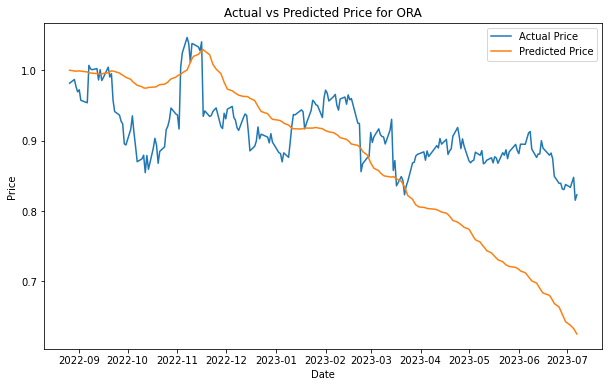

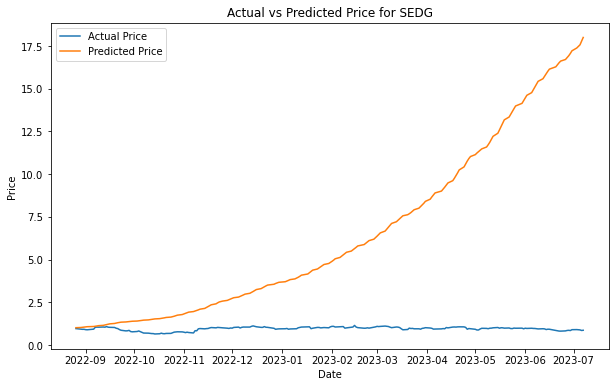

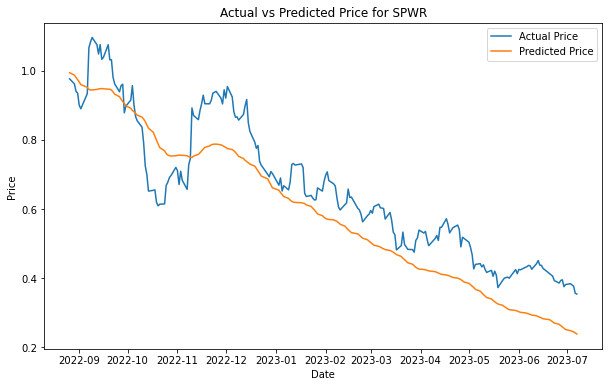

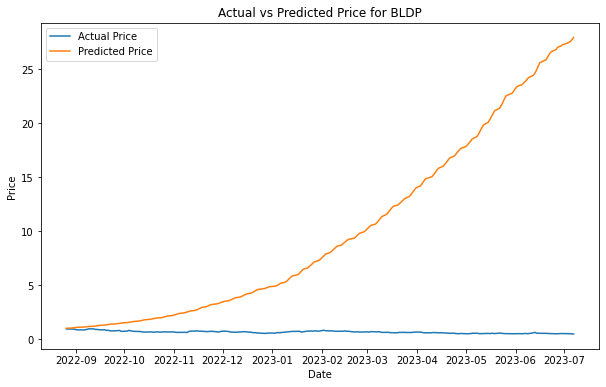

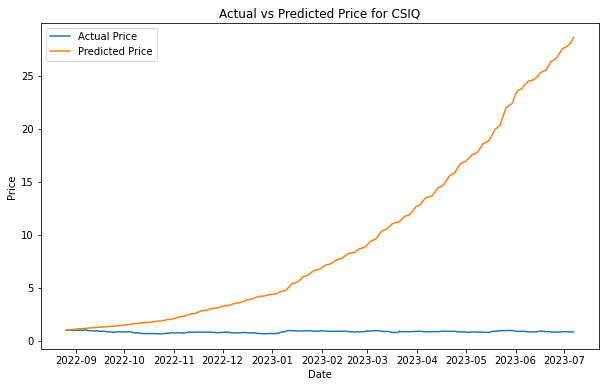

In [47]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [48]:
features_dict = {
    "BE": [],
    "BLDP": [],
    "CSIQ": [],
    "DNNGY": [],
    "ENPH": [],
    "FSLR": [],
    "IBDRY": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "NEE": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "ORA": ["VIX_OPEN", "VIX_CLOSE", "VIX_LOW", "VIX_HIGH", "NASDAQ_Close"],
    "PLUG": [],
    "RUN": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "SEDG": [],
    "SPWR": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "VWDRY": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"]
}


In [49]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 1s 7ms/step
MSE for ENPH: 0.0014155585168169932
7/7 [==============================] - 1s 11ms/step
MSE for NEE: 0.0003126665323328338
7/7 [==============================] - 1s 8ms/step
MSE for IBDRY: 0.0001780010958259049
7/7 [==============================] - 1s 9ms/step
MSE for VWDRY: 0.0006816500278197572
7/7 [==============================] - 1s 8ms/step
MSE for DNNGY: 0.0006457577880562494
7/7 [==============================] - 0s 6ms/step
MSE for FSLR: 0.0012638758852755911
7/7 [==============================] - 1s 7ms/step
MSE for RUN: 0.0024595943069278957
7/7 [==============================] - 1s 6ms/step
MSE for PLUG: 0.002013217296391422
7/7 [==============================] - 1s 7ms/step
MSE for BE: 0.0015739866784737191
7/7 [==============================] - 1s 8ms/step
MSE for ORA: 0.0004009470272580382
7/7 [==============================] - 1s 9ms/step
MSE for SEDG: 0.00143530289998877
7/7 [==============================] - 1s 7ms/s

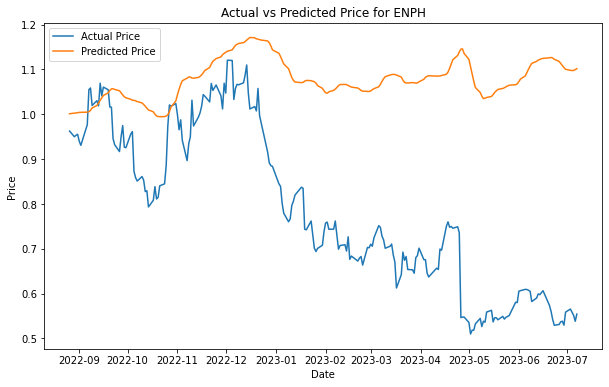

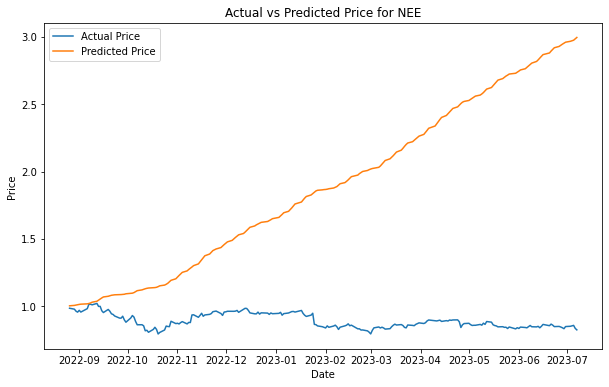

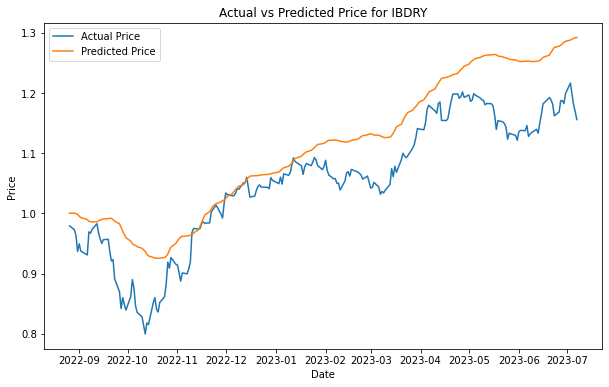

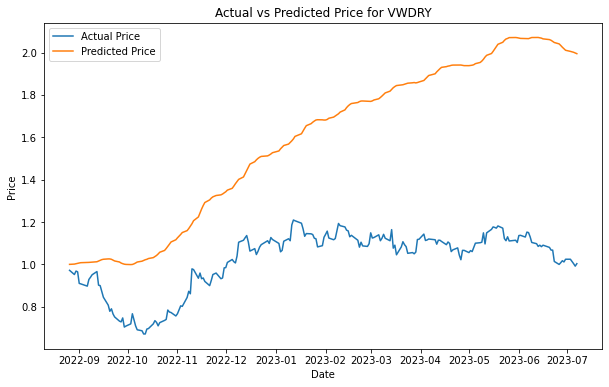

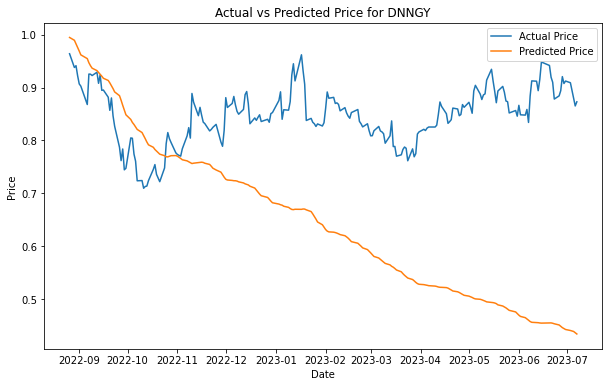

...

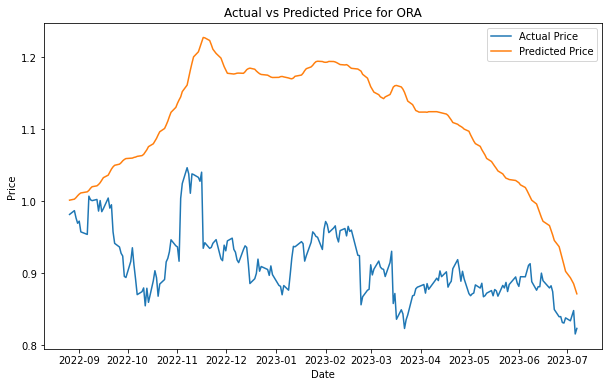

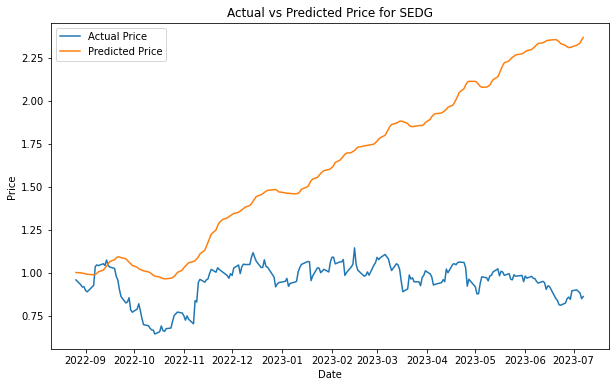

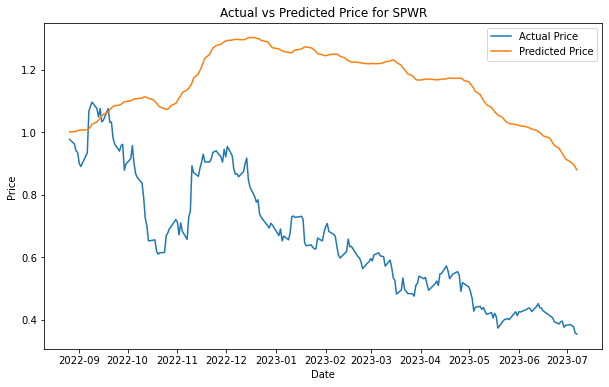

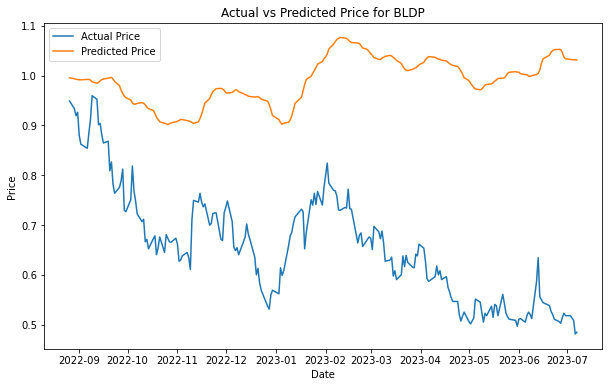

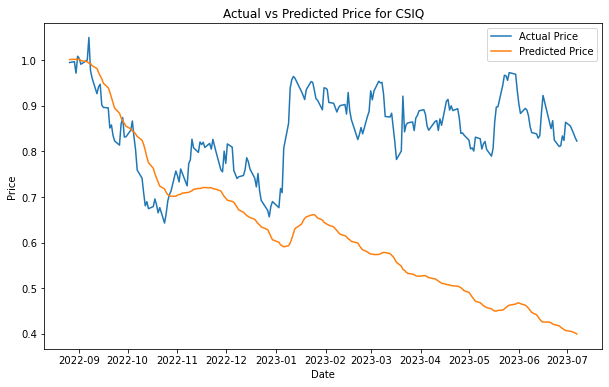

In [50]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [54]:
features_dict = {
    "BE": [],
    "BLDP": ["VIX_CLose"],
    "CSIQ": ["NASDAQ_Close","VIX_CLOSE"],
    "DNNGY": ["VIX_CLOSE","VIX_LOW"],
    "ENPH": ["NASDAQ_Close","VIX_CLOSE"],
    "FSLR": ["VIX_CLOSE"],
    "IBDRY": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "NEE": ["VIX_CLOSE", "S&P500", "NASDAQ_Close"],
    "ORA": ["VIX_OPEN", "VIX_CLOSE", "VIX_LOW", "VIX_HIGH", "NASDAQ_Close"],
    "PLUG": [],
    "RUN": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"],
    "SEDG": ["VIX_CLOSE","NASDAQ_Close"],
    "SPWR": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "NASDAQ_Close"],
    "VWDRY": ["VIX_CLOSE", "VIX_OPEN", "VIX_HIGH", "S&P500", "NASDAQ_Close"]
}


In [57]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 0s 4ms/step
MSE for ENPH: 0.001408439095093937
7/7 [==============================] - 1s 9ms/step
MSE for NEE: 0.000293511709019697
7/7 [==============================] - 0s 7ms/step
MSE for IBDRY: 0.00018336449727751725
7/7 [==============================] - 1s 9ms/step
MSE for VWDRY: 0.0006756217960904433
7/7 [==============================] - 1s 11ms/step
MSE for DNNGY: 0.0006647096495738227
7/7 [==============================] - 1s 11ms/step
MSE for FSLR: 0.0012135010407938965
7/7 [==============================] - 0s 8ms/step
MSE for RUN: 0.0025096228758297746
7/7 [==============================] - 1s 8ms/step
MSE for PLUG: 0.0020390629422529123
7/7 [==============================] - 0s 8ms/step
MSE for BE: 0.0015766191315638963
7/7 [==============================] - 0s 9ms/step
MSE for ORA: 0.0004088628935294838
7/7 [==============================] - 1s 11ms/step
MSE for SEDG: 0.0014840325601954071
7/7 [==============================] - 1s 1

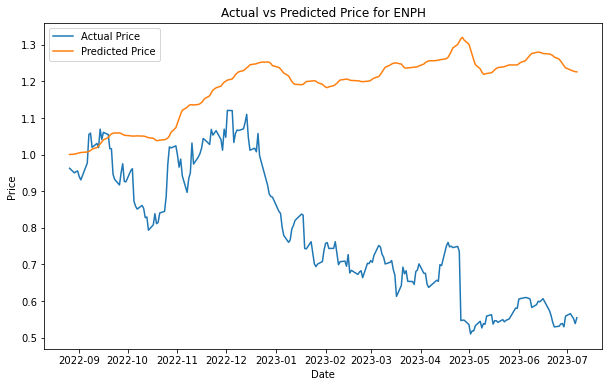

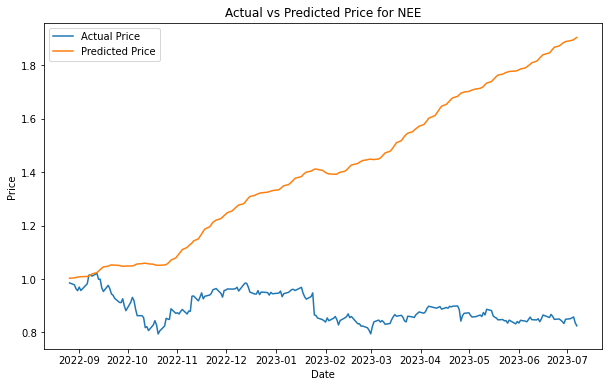

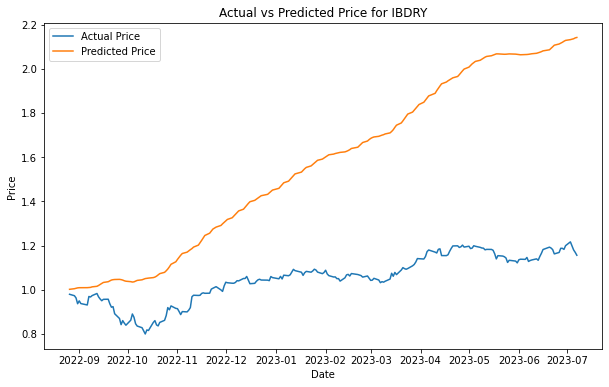

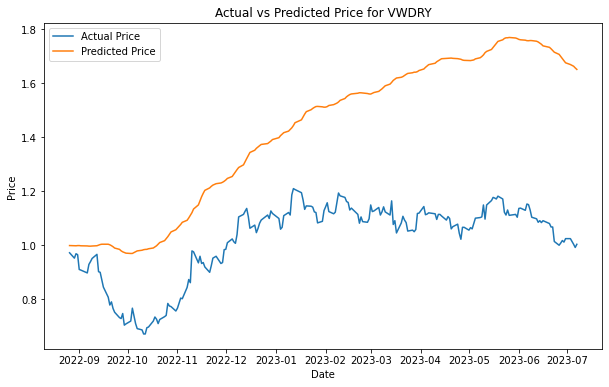

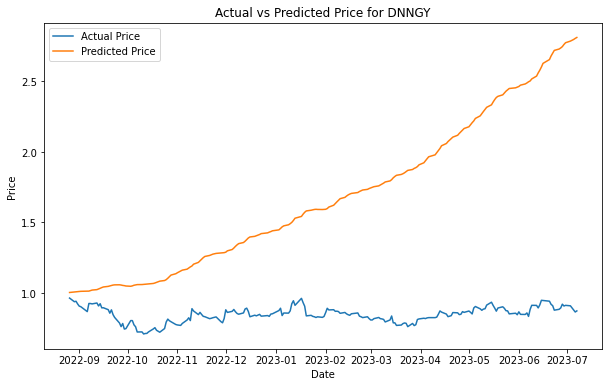

...

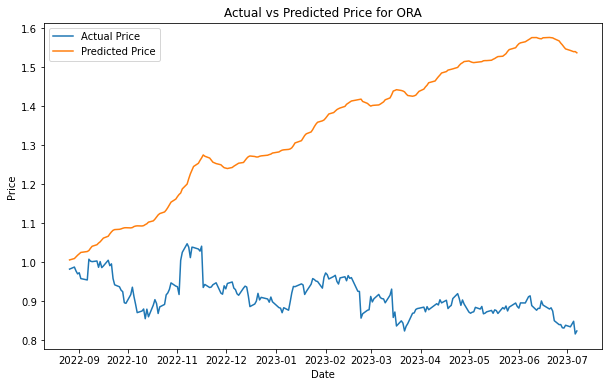

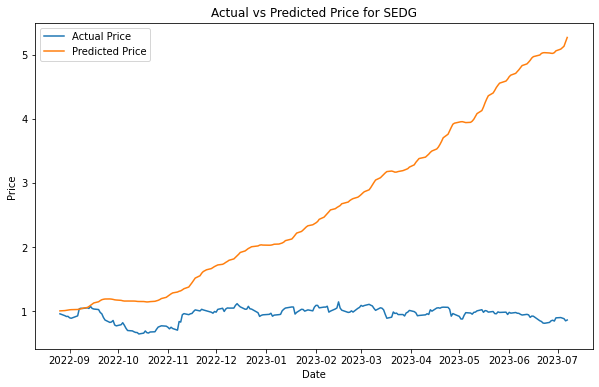

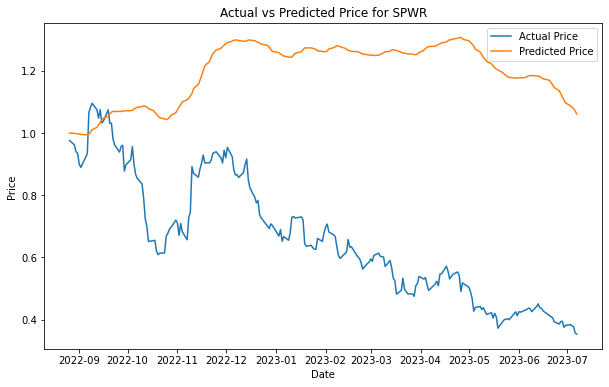

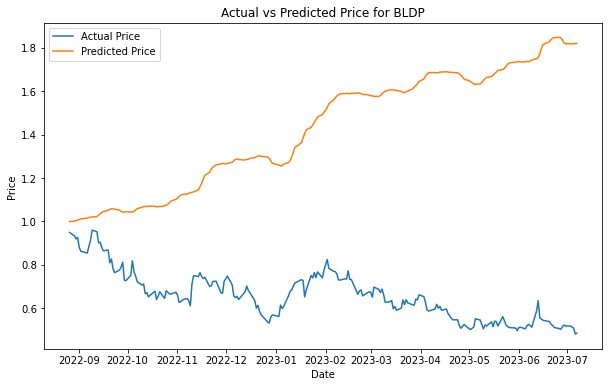

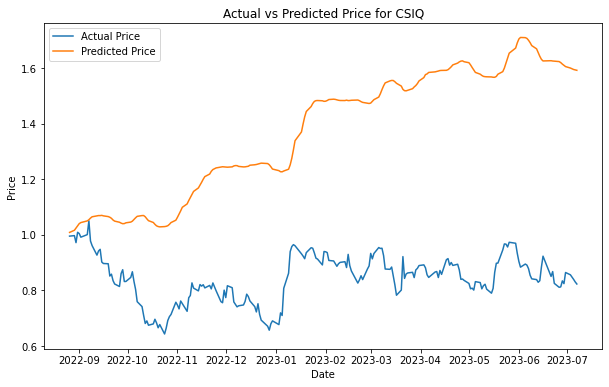

In [58]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [60]:
features_dict = {
    "BE": ["NASDAQ_Close"],
    "BLDP": ["NASDAQ_Close"],
    "CSIQ": ["NASDAQ_Close"],
    "DNNGY": ["NASDAQ_Close"],
    "ENPH": ["NASDAQ_Close"],
    "FSLR": ["NASDAQ_Close"],
    "IBDRY": ["NASDAQ_Close"],
    "NEE": ["NASDAQ_Close"],
    "ORA": ["NASDAQ_Close"],
    "PLUG": ["NASDAQ_Close"],
    "RUN": ["NASDAQ_Close"],
    "SEDG": ["NASDAQ_Close"],
    "SPWR": ["NASDAQ_Close"],
    "VWDRY": ["NASDAQ_Close"]
}

In [61]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 0s 7ms/step
MSE for ENPH: 0.0014758739448318295
7/7 [==============================] - 1s 4ms/step
MSE for NEE: 0.0002834548302079143
7/7 [==============================] - 0s 7ms/step
MSE for IBDRY: 0.00018009709211687177
7/7 [==============================] - 1s 11ms/step
MSE for VWDRY: 0.0006758127859431457
7/7 [==============================] - 0s 10ms/step
MSE for DNNGY: 0.0006305978563693243
7/7 [==============================] - 1s 13ms/step
MSE for FSLR: 0.0012833280453419971
7/7 [==============================] - 0s 11ms/step
MSE for RUN: 0.002504034803657042
7/7 [==============================] - 0s 10ms/step
MSE for PLUG: 0.0020325335983082077
7/7 [==============================] - 1s 7ms/step
MSE for BE: 0.0015670379735426277
7/7 [==============================] - 0s 9ms/step
MSE for ORA: 0.00045497949059971824
7/7 [==============================] - 0s 11ms/step
MSE for SEDG: 0.001411155242889286
7/7 [==============================] - 

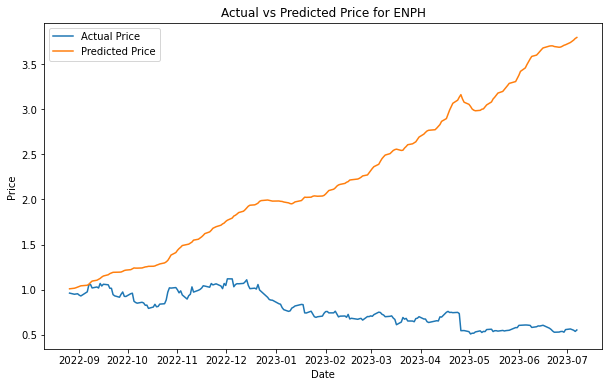

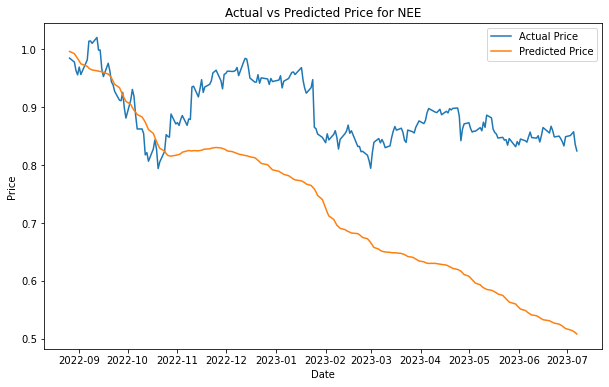

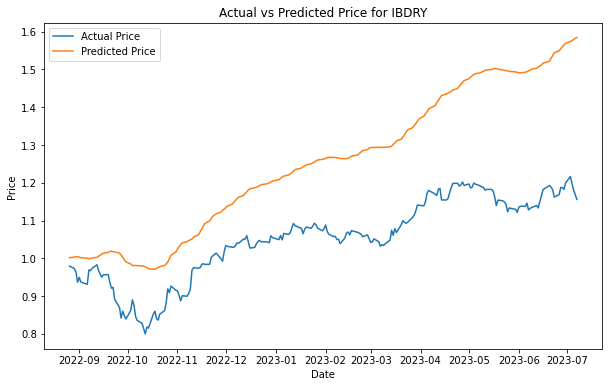

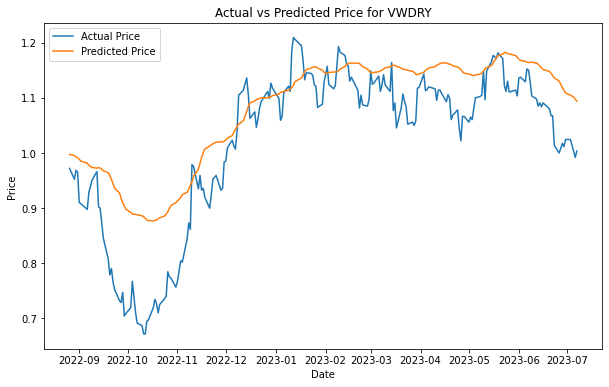

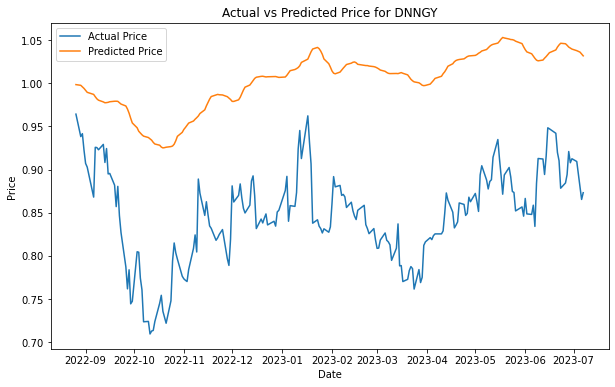

...

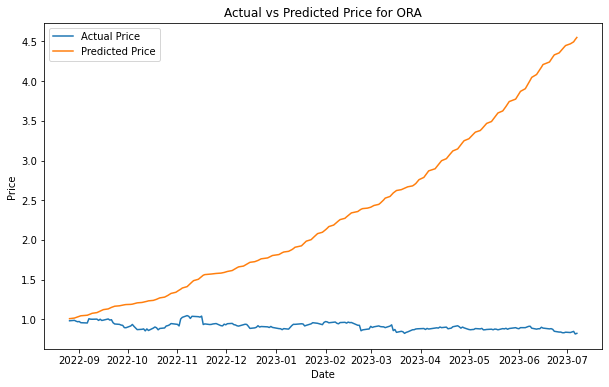

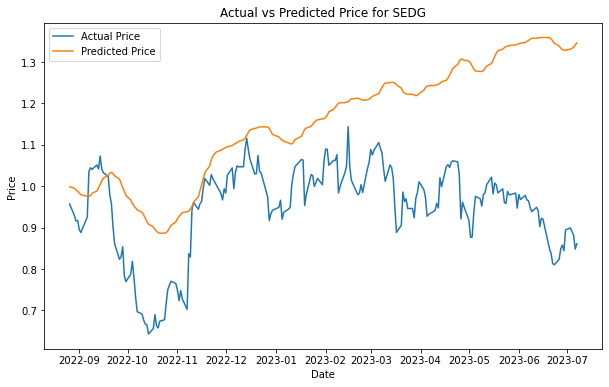

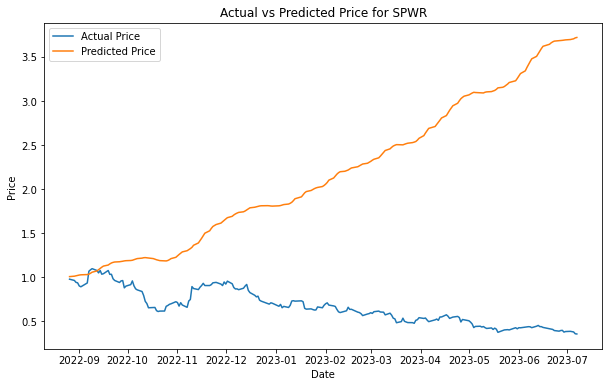

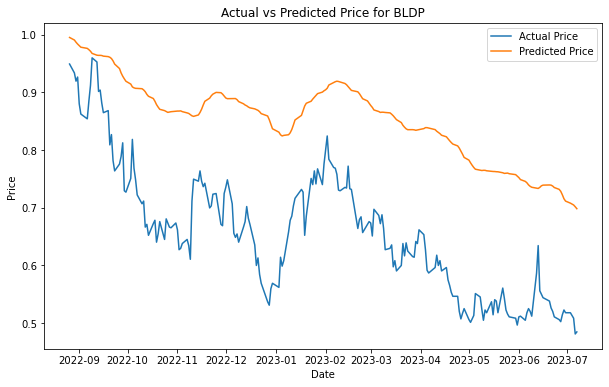

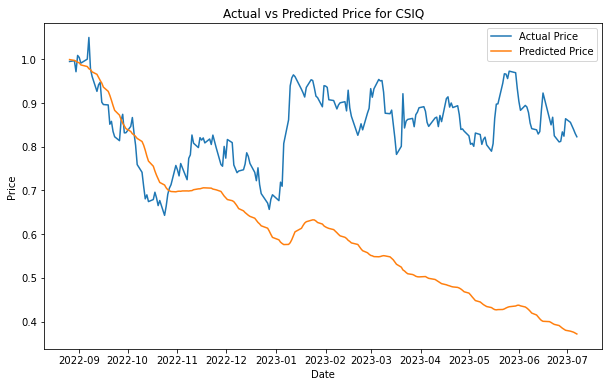

In [62]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [72]:
features_dict = {
    "BE": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "BLDP": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "CSIQ": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "DNNGY": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "ENPH": ["VIX_CLOSE","VIX_HIGH"],
    "FSLR": [],
    "IBDRY": ["NASDAQ_Close","VIX_CLOSE"],
    "NEE": ["NASDAQ_Close","VIX_HIGH"],
    "ORA": ["VIX_HIGH"],
    "PLUG": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "RUN": ["NASDAQ_Close","VIX_HIGH"],
    "SEDG": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "SPWR": ["VIX_HIGH"],
    "VWDRY": ["NASDAQ_Close"]
}

In [73]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 0s 7ms/step
MSE for ENPH: 0.0014343852965150949
7/7 [==============================] - 0s 7ms/step
MSE for NEE: 0.00027813014835076843
7/7 [==============================] - 0s 7ms/step
MSE for IBDRY: 0.00017710424823632335
7/7 [==============================] - 1s 9ms/step
MSE for VWDRY: 0.0006968045977853458
7/7 [==============================] - 1s 7ms/step
MSE for DNNGY: 0.0006521589958955259
7/7 [==============================] - 0s 6ms/step
MSE for FSLR: 0.0012496601883620743
7/7 [==============================] - 1s 8ms/step
MSE for RUN: 0.0024748535716910404
7/7 [==============================] - 0s 7ms/step
MSE for PLUG: 0.0020295763240307696
7/7 [==============================] - 0s 7ms/step
MSE for BE: 0.0016021450104420252
7/7 [==============================] - 1s 10ms/step
MSE for ORA: 0.0004051994458345786
7/7 [==============================] - 0s 7ms/step
MSE for SEDG: 0.001414121578367859
7/7 [==============================] - 0s 7

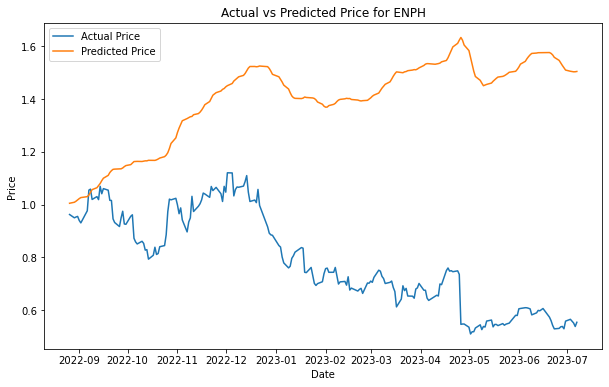

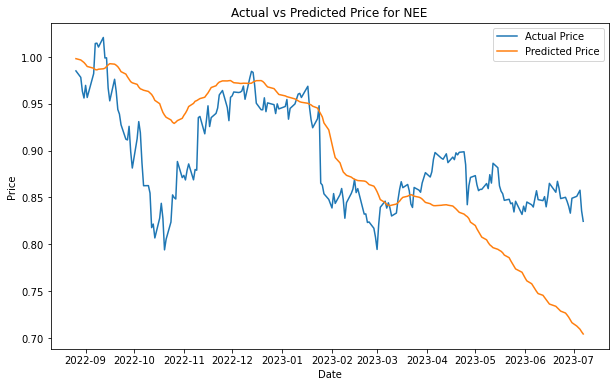

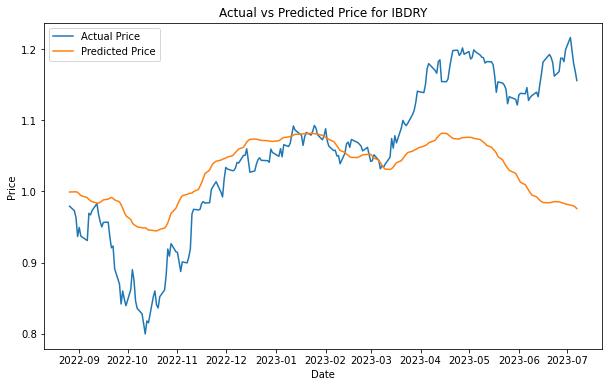

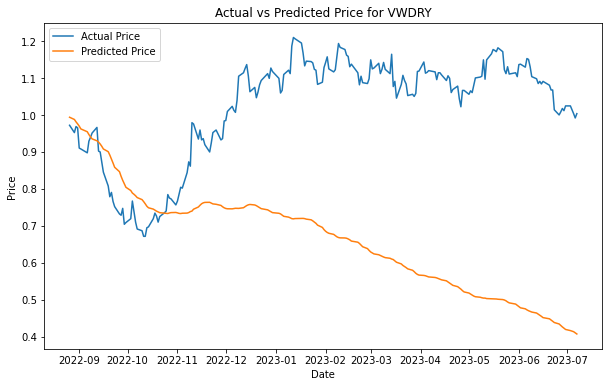

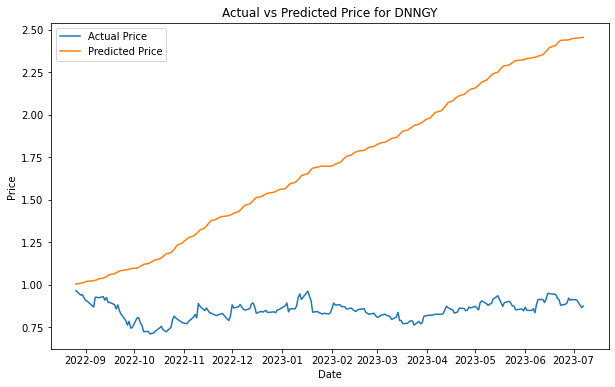

...

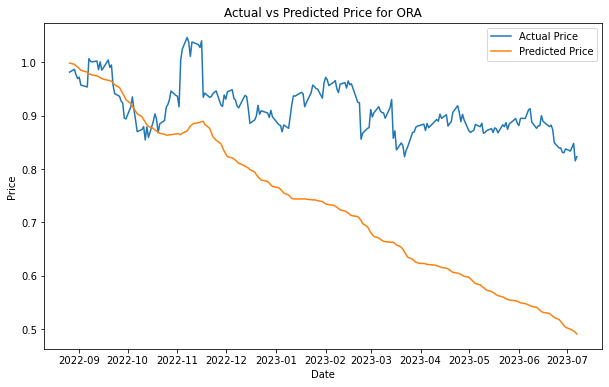

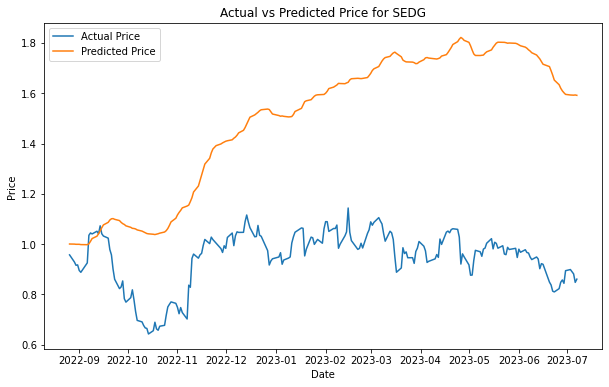

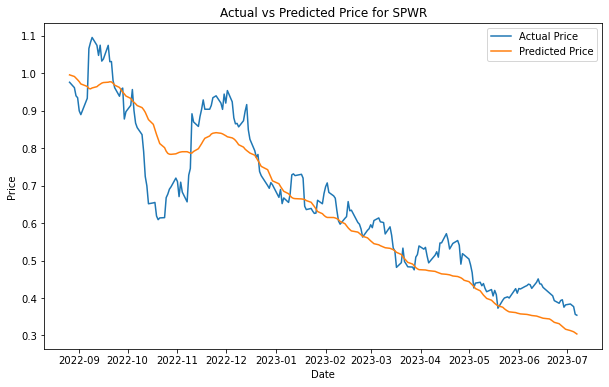

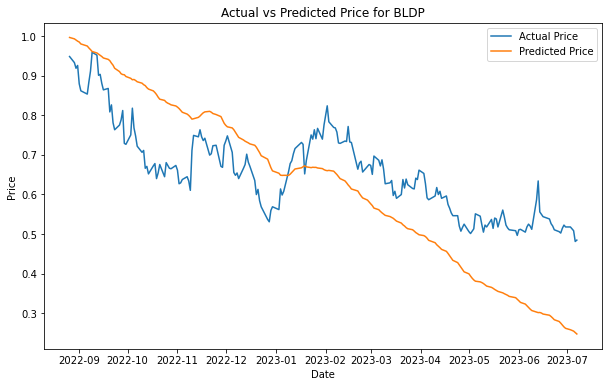

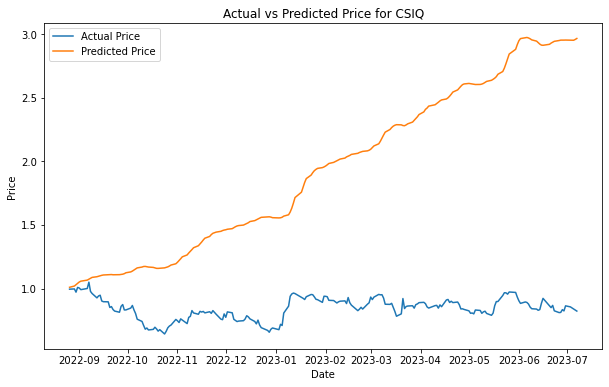

In [74]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [96]:
features_dict = {
    "BE": ["NASDAQ_Close","VIX_CLOSE"],
    "BLDP": ["VIX_CLOSE"],
    "CSIQ": ["VIX_CLOSE"],
    "DNNGY": ["VIX_CLOSE"],
    "ENPH": ["VIX_CLOSE","VIX_HIGH"],
    "FSLR": ["NASDAQ_Close","VIX_CLOSE"],
    "IBDRY": ["VIX_CLOSE"],
    "NEE": ["VIX_CLOSE"],
    "ORA": [],
    "PLUG": ["NASDAQ_Close"],
    "RUN": ["NASDAQ_Close","VIX_CLOSE"],
    "SEDG": ["NASDAQ_Close","VIX_CLOSE"],
    "SPWR": [],
    "VWDRY": ["VIX_CLOSE"]
}

In [99]:
features_dict = {
    "BE": ["NASDAQ_Close","VIX_CLOSE"],
    "BLDP": ["VIX_CLOSE"],
    "CSIQ": ["VIX_CLOSE"],
    "DNNGY": ["VIX_CLOSE"],
    "ENPH": ["VIX_CLOSE","VIX_HIGH"],
    "FSLR": ["NASDAQ_Close","VIX_CLOSE"],
    "IBDRY": ["VIX_CLOSE"],
    "NEE": ["VIX_CLOSE"],
    "ORA": ["VIX_OPEN"],
    "PLUG": ["NASDAQ_Close"],
    "RUN": ["NASDAQ_Close","VIX_CLOSE"],
    "SEDG": ["NASDAQ_Close","VIX_CLOSE"],
    "SPWR": [],
    "VWDRY": ["VIX_CLOSE"]
}

In [125]:
features_dict = {
    "BE": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "BLDP": ["VIX_CLOSE","VIX_HIGH"],
    "CSIQ": ["VIX_CLOSE","VIX_HIGH"],
    "DNNGY": ["VIX_CLOSE","VIX_HIGH"],
    "ENPH": ["VIX_CLOSE","VIX_HIGH"],
    "FSLR": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "IBDRY": ["VIX_CLOSE","VIX_HIGH"],
    "NEE": ["VIX_CLOSE","VIX_HIGH"],
    "ORA": ["VIX_OPEN"],
    "PLUG": ["NASDAQ_Close","VIX_HIGH"],
    "RUN": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "SEDG": ["NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "SPWR": ["VIX_CLOSE","VIX_HIGH"],
    "VWDRY": ["VIX_CLOSE","VIX_HIGH"]
}

In [126]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 0s 6ms/step
MSE for ENPH: 0.0014214242802081866
7/7 [==============================] - 1s 8ms/step
MSE for NEE: 0.00028030094105499525
7/7 [==============================] - 1s 14ms/step
MSE for IBDRY: 0.00017849075158027225
7/7 [==============================] - 1s 7ms/step
MSE for VWDRY: 0.0006794989372188099
7/7 [==============================] - 1s 7ms/step
MSE for DNNGY: 0.0006636686679561883
7/7 [==============================] - 1s 6ms/step
MSE for FSLR: 0.0012076574881976037
7/7 [==============================] - 1s 8ms/step
MSE for RUN: 0.0025015226015410543
7/7 [==============================] - 0s 5ms/step
MSE for PLUG: 0.0020609986494308364
7/7 [==============================] - 0s 8ms/step
MSE for BE: 0.0015800180349778727
7/7 [==============================] - 1s 8ms/step
MSE for ORA: 0.000402948002738631
7/7 [==============================] - 2s 19ms/step
MSE for SEDG: 0.001501769641238063
7/7 [==============================] - 2s 2

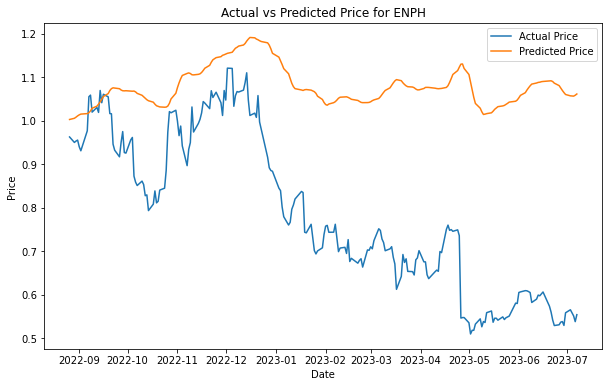

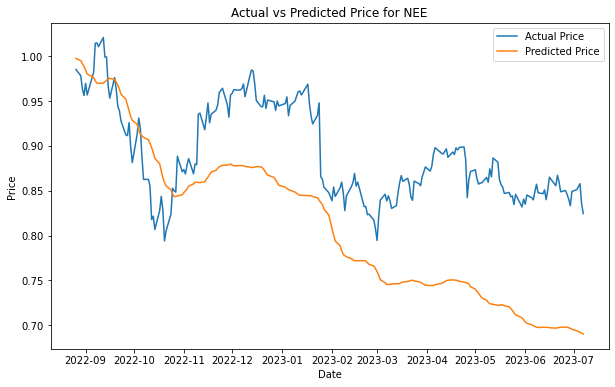

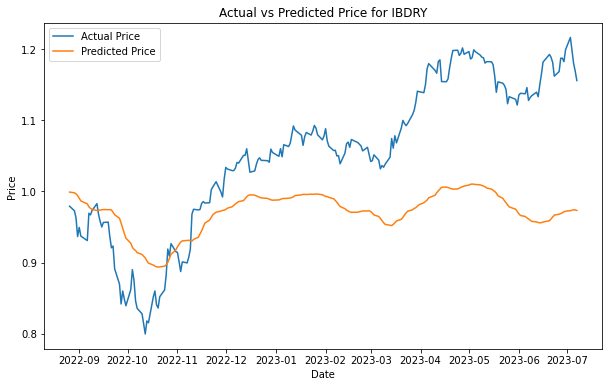

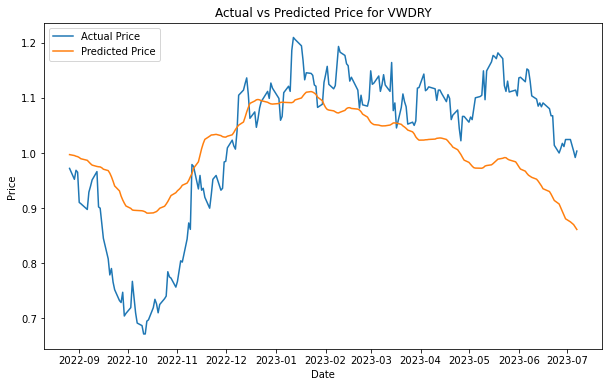

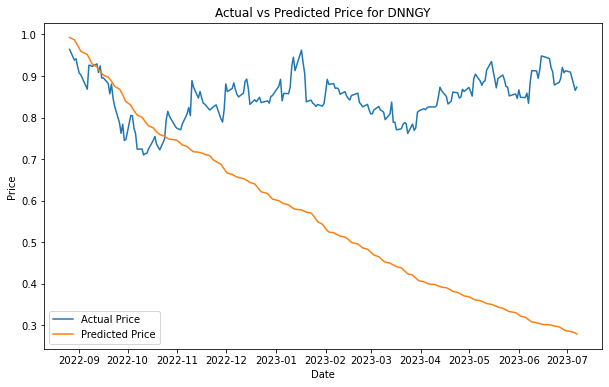

...

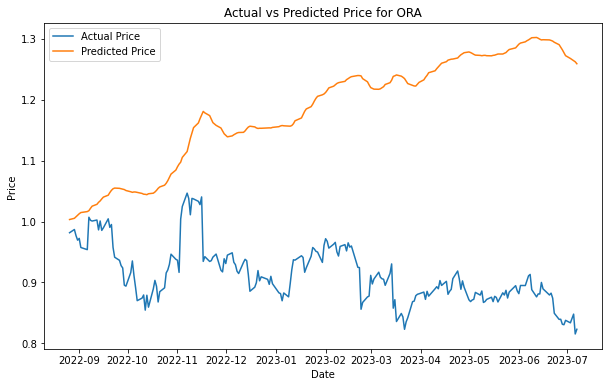

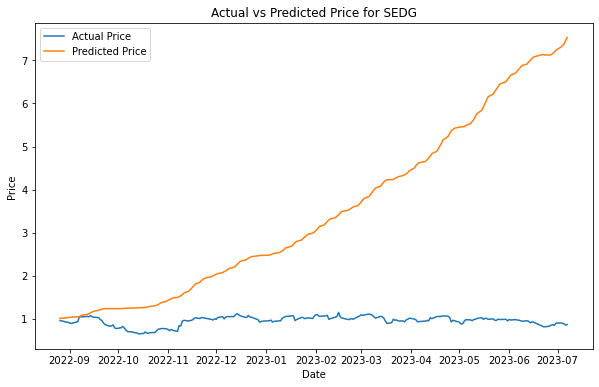

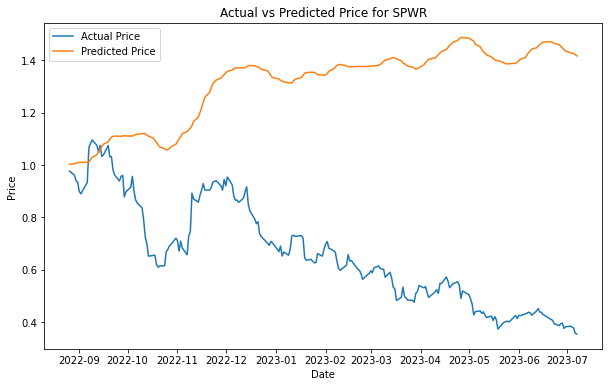

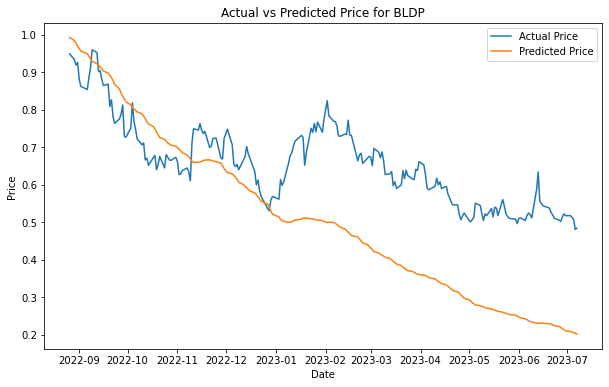

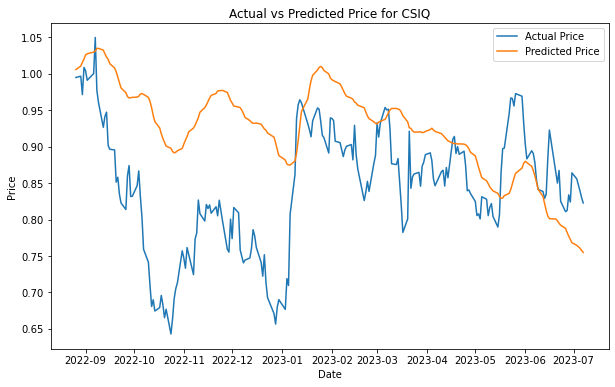

In [127]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [129]:
df_cpiaucsl = pd.read_csv("CPIAUCSL.csv")

In [131]:
df_cpiaucsl

,DATE,CPIAUCSL
0,1947-01-01,21.480
1,1947-02-01,21.620
2,1947-03-01,22.000
3,1947-04-01,22.000
4,1947-05-01,21.950
...,...,...
913,2023-02-01,301.648
914,2023-03-01,301.808
915,2023-04-01,302.918
916,2023-05-01,303.294


In [132]:
merged_dfbackup = merged_df

In [133]:
merged_dfbackup

,Date,Ticker,Return,VIX_OPEN,VIX_HIGH,VIX_LOW,VIX_CLOSE,NASDAQ_Close,S&P500
0,2019-01-14,ENPH,0.024648,19.96,19.99,18.70,19.07,6905.919922,2582.610107
1,2019-01-14,NEE,-0.025497,19.96,19.99,18.70,19.07,6905.919922,2582.610107
2,2019-01-14,IBDRY,-0.002522,19.96,19.99,18.70,19.07,6905.919922,2582.610107
3,2019-01-14,VWDRY,-0.008139,19.96,19.99,18.70,19.07,6905.919922,2582.610107
4,2019-01-14,DNNGY,-0.025552,19.96,19.99,18.70,19.07,6905.919922,2582.610107
...,...,...,...,...,...,...,...,...,...
15787,2023-07-07,ORA,0.009450,15.97,16.06,14.33,14.83,13660.719727,4398.950195
15788,2023-07-07,SEDG,0.015133,15.97,16.06,14.33,14.83,13660.719727,4398.950195
15789,2023-07-07,SPWR,-0.006557,15.97,16.06,14.33,14.83,13660.719727,4398.950195
15790,2023-07-07,BLDP,0.007407,15.97,16.06,14.33,14.83,13660.719727,4398.950195


In [134]:
# Ensure the dates are in the right format
df_cpiaucsl['DATE'] = pd.to_datetime(df_cpiaucsl['DATE'])
merged_df['Date'] = pd.to_datetime(merged_df['Date'])

# Set 'DATE' and 'Date' as indices in df_cpiaucsl and merged_df respectively
df_cpiaucsl.set_index('DATE', inplace=True)
merged_df.set_index('Date', inplace=True)

# Merge the dataframes
merged_df = merged_df.join(df_cpiaucsl)

# Reset the index
merged_df.reset_index(inplace=True)


In [137]:
merged_df= merged_dfbackup

In [138]:
merged_df

,Ticker,Return,VIX_OPEN,VIX_HIGH,VIX_LOW,VIX_CLOSE,NASDAQ_Close,S&P500
Date,,,,,,,,
2019-01-14,ENPH,0.024648,19.96,19.99,18.70,19.07,6905.919922,2582.610107
2019-01-14,NEE,-0.025497,19.96,19.99,18.70,19.07,6905.919922,2582.610107
2019-01-14,IBDRY,-0.002522,19.96,19.99,18.70,19.07,6905.919922,2582.610107
2019-01-14,VWDRY,-0.008139,19.96,19.99,18.70,19.07,6905.919922,2582.610107
2019-01-14,DNNGY,-0.025552,19.96,19.99,18.70,19.07,6905.919922,2582.610107
...,...,...,...,...,...,...,...,...
2023-07-07,ORA,0.009450,15.97,16.06,14.33,14.83,13660.719727,4398.950195
2023-07-07,SEDG,0.015133,15.97,16.06,14.33,14.83,13660.719727,4398.950195
2023-07-07,SPWR,-0.006557,15.97,16.06,14.33,14.83,13660.719727,4398.950195


In [142]:
# Ensure the dates are in the right format and resetting the index before setting it
df_cpiaucsl.reset_index(inplace=True)
merged_df.reset_index(inplace=True)

df_cpiaucsl['DATE'] = pd.to_datetime(df_cpiaucsl['DATE'])
merged_df['Date'] = pd.to_datetime(merged_df['Date'])

# Rename 'DATE' column in df_cpiaucsl to 'Date'
df_cpiaucsl.rename(columns={'DATE': 'Date'}, inplace=True)

# Set 'Date' as indices in df_cpiaucsl and merged_df
df_cpiaucsl.set_index('Date', inplace=True)
merged_df.set_index('Date', inplace=True)

# Resample the CPIAUCSL dataframe to forward fill for each day of month
df_cpiaucsl = df_cpiaucsl.resample('D').ffill()

# Merge the dataframes
merged_df = merged_df.join(df_cpiaucsl)

# Reset the index
merged_df.reset_index(inplace=True)



In [143]:
merged_df = merged_df.dropna()

,Date,Ticker,Return,VIX_OPEN,VIX_HIGH,VIX_LOW,VIX_CLOSE,NASDAQ_Close,S&P500,CPIAUCSL
0,2019-01-14,ENPH,0.024648,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
1,2019-01-14,NEE,-0.025497,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
2,2019-01-14,IBDRY,-0.002522,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
3,2019-01-14,VWDRY,-0.008139,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
4,2019-01-14,DNNGY,-0.025552,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
...,...,...,...,...,...,...,...,...,...,...
15787,2023-07-07,ORA,0.009450,15.97,16.06,14.33,14.83,13660.719727,4398.950195,NaN
15788,2023-07-07,SEDG,0.015133,15.97,16.06,14.33,14.83,13660.719727,4398.950195,NaN
15789,2023-07-07,SPWR,-0.006557,15.97,16.06,14.33,14.83,13660.719727,4398.950195,NaN
15790,2023-07-07,BLDP,0.007407,15.97,16.06,14.33,14.83,13660.719727,4398.950195,NaN


In [144]:
merged_df = merged_df.dropna()

In [145]:
merged_df

,Date,Ticker,Return,VIX_OPEN,VIX_HIGH,VIX_LOW,VIX_CLOSE,NASDAQ_Close,S&P500,CPIAUCSL
0,2019-01-14,ENPH,0.024648,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
1,2019-01-14,NEE,-0.025497,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
2,2019-01-14,IBDRY,-0.002522,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
3,2019-01-14,VWDRY,-0.008139,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
4,2019-01-14,DNNGY,-0.025552,19.96,19.99,18.70,19.07,6905.919922,2582.610107,252.718
...,...,...,...,...,...,...,...,...,...,...
15451,2023-06-01,ORA,-0.005053,17.24,17.59,15.58,15.65,13100.980469,4221.020020,303.841
15452,2023-06-01,SEDG,0.034828,17.24,17.59,15.58,15.65,13100.980469,4221.020020,303.841
15453,2023-06-01,SPWR,0.030189,17.24,17.59,15.58,15.65,13100.980469,4221.020020,303.841
15454,2023-06-01,BLDP,0.028708,17.24,17.59,15.58,15.65,13100.980469,4221.020020,303.841


In [161]:
features_dict = {
    "BE": ["CPIAUCSL","NASDAQ_Close"],
    "BLDP": ["CPIAUCSL","VIX_CLOSE"],
    "CSIQ": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE"],
    "DNNGY": ["CPIAUCSL","VIX_CLOSE"],
    "ENPH": ["VIX_CLOSE"],
    "FSLR": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE"],
    "IBDRY": ["CPIAUCSL","VIX_CLOSE"],
    "NEE": ["CPIAUCSL","VIX_CLOSE"],
    "ORA": ["CPIAUCSL","VIX_CLOSE"],
    "PLUG": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE"],
    "RUN": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE"],
    "SEDG": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE"],
    "SPWR": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE"],
    "VWDRY": ["CPIAUCSL","VIX_CLOSE"]
}

In [162]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 1s 8ms/step
MSE for ENPH: 0.001444508831579327
7/7 [==============================] - 1s 11ms/step
MSE for NEE: 0.0002836617173530584
7/7 [==============================] - 1s 10ms/step
MSE for IBDRY: 0.00017843196573695294
7/7 [==============================] - 1s 10ms/step
MSE for VWDRY: 0.0007532114204761248
7/7 [==============================] - 0s 7ms/step
MSE for DNNGY: 0.0006616889629774247
7/7 [==============================] - 0s 7ms/step
MSE for FSLR: 0.0012530265223317572
7/7 [==============================] - 0s 9ms/step
MSE for RUN: 0.00261424400414146
7/7 [==============================] - 1s 8ms/step
MSE for PLUG: 0.0020699465834488643
7/7 [==============================] - 1s 12ms/step
MSE for BE: 0.001966651769441115
7/7 [==============================] - 0s 7ms/step
MSE for ORA: 0.00042584241877787073
7/7 [==============================] - 0s 8ms/step
MSE for SEDG: 0.0016502899682063108
7/7 [==============================] - 1s 8

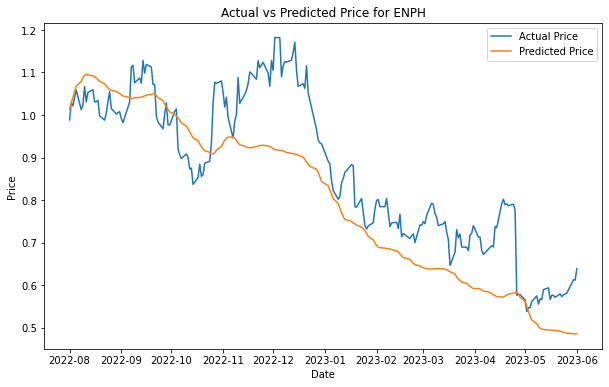

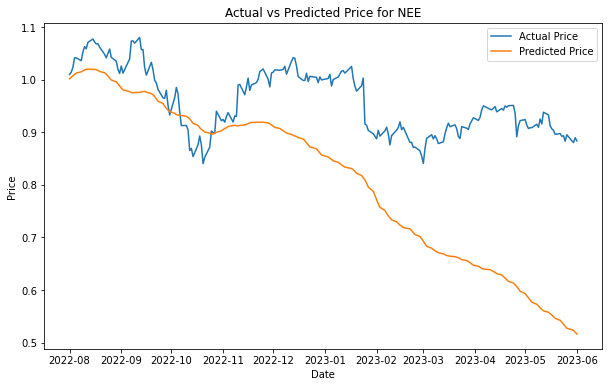

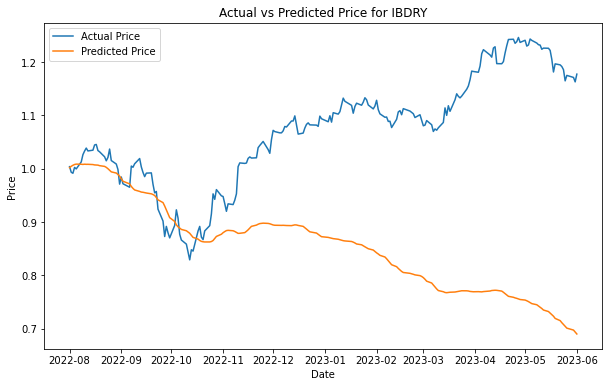

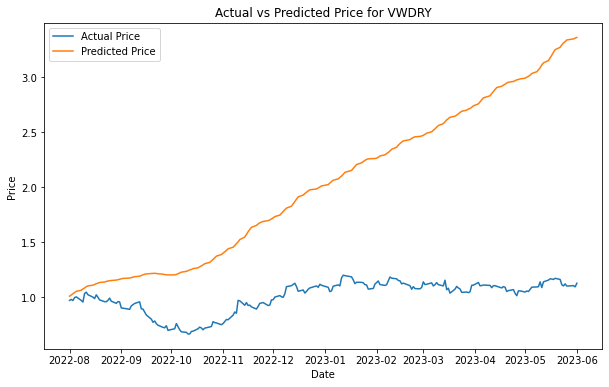

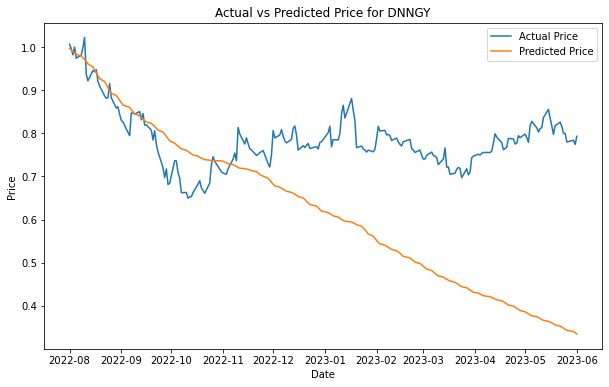

...

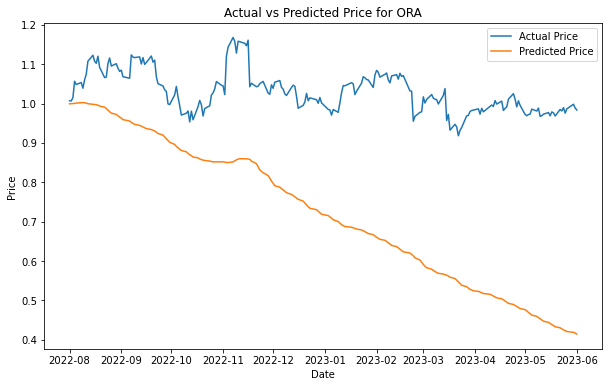

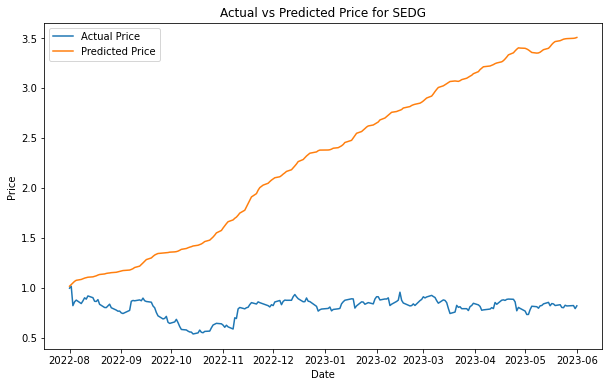

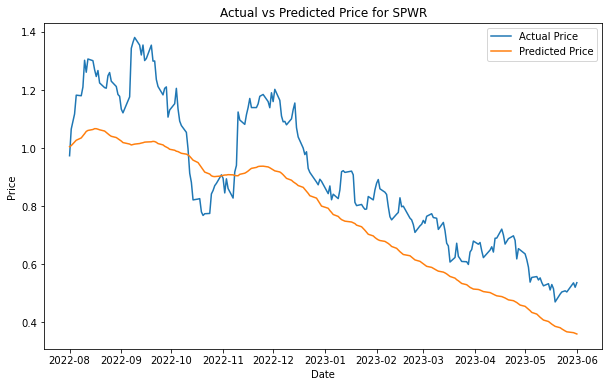

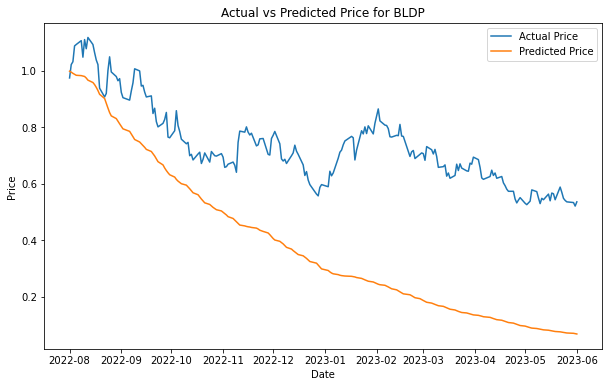

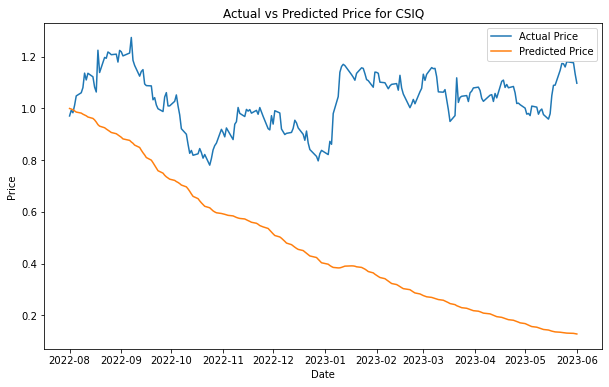

In [163]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')


In [213]:
features_dict = {
    "BE": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "BLDP": ["CPIAUCSL","VIX_CLOSE","VIX_HIGH","NASDAQ_Close"],
    "CSIQ": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "DNNGY": ["CPIAUCSL","VIX_CLOSE","VIX_HIGH","NASDAQ_Close"],
    "ENPH": ["VIX_CLOSE","NASDAQ_Close"],
    "FSLR": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "IBDRY": ["CPIAUCSL","VIX_CLOSE","VIX_HIGH","NASDAQ_Close"],
    "NEE": ["CPIAUCSL","VIX_CLOSE","VIX_HIGH","NASDAQ_Close"],
    "ORA": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE"],
    "PLUG": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "RUN": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "SEDG": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "SPWR": ["CPIAUCSL","NASDAQ_Close","VIX_CLOSE","VIX_HIGH"],
    "VWDRY": ["CPIAUCSL","VIX_CLOSE","VIX_HIGH","NASDAQ_Close"]
}

In [214]:
# Define the lookback period and split inputs/outputs
lookback = 10
train_size_frac = 0.8

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))  # input_shape is now (lookback, len(features)+1)
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    model.fit(x_train, y_train, epochs=20, batch_size=32, verbose=0)

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

7/7 [==============================] - 1s 8ms/step
MSE for ENPH: 0.0014356422183070955
7/7 [==============================] - 1s 13ms/step
MSE for NEE: 0.0002756289378972126
7/7 [==============================] - 1s 15ms/step
MSE for IBDRY: 0.0002171411571720364
7/7 [==============================] - 2s 14ms/step
MSE for VWDRY: 0.0008046606594796068
7/7 [==============================] - 2s 22ms/step
MSE for DNNGY: 0.0006537096941441458
7/7 [==============================] - 2s 15ms/step
MSE for FSLR: 0.0012258309174412879
7/7 [==============================] - 0s 5ms/step
MSE for RUN: 0.0026271647844668044
7/7 [==============================] - 1s 9ms/step
MSE for PLUG: 0.0022923815843359863
7/7 [==============================] - 1s 10ms/step
MSE for BE: 0.0017414228279833814
7/7 [==============================] - 0s 7ms/step
MSE for ORA: 0.00040745308302946476
7/7 [==============================] - 1s 7ms/step
MSE for SEDG: 0.0016689822865110534
7/7 [==============================] -

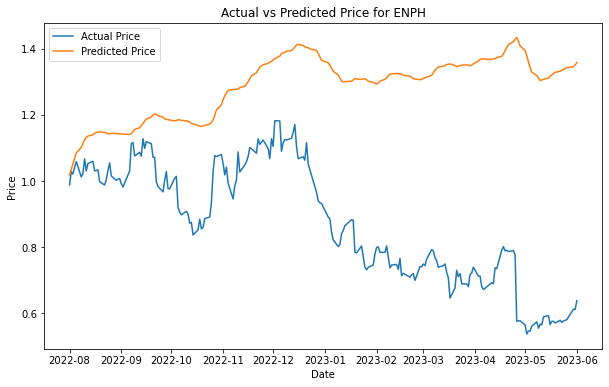

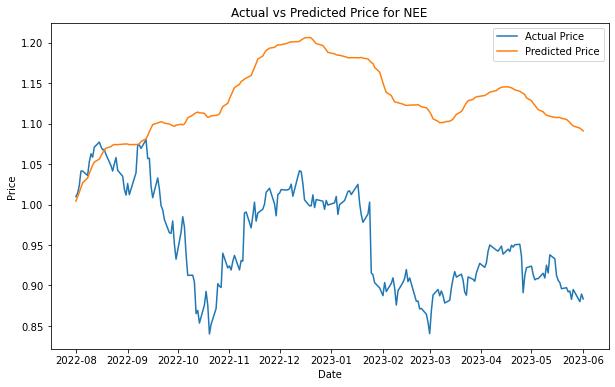

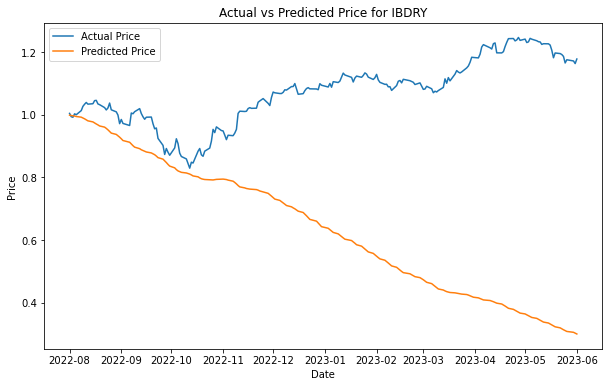

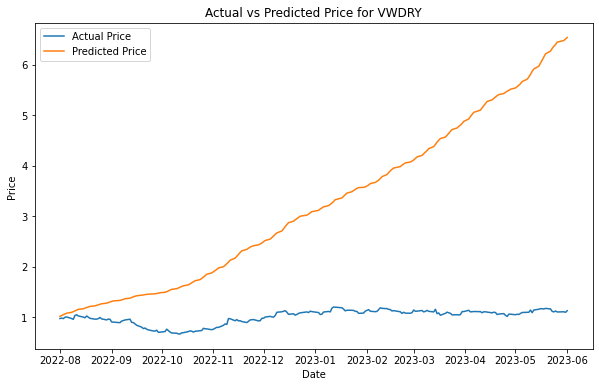

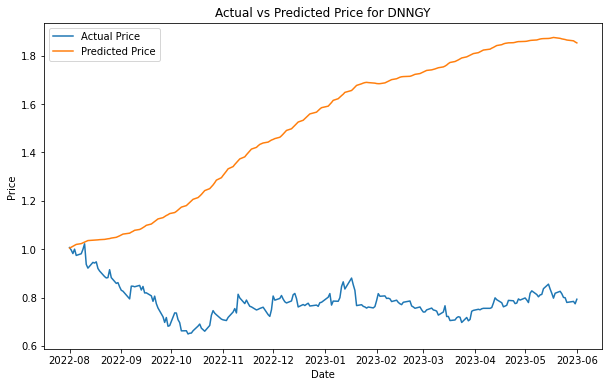

...

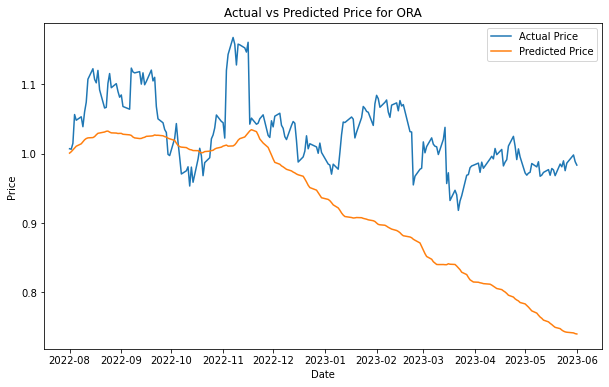

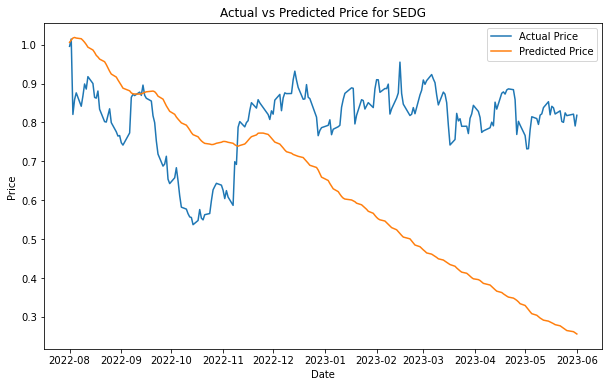

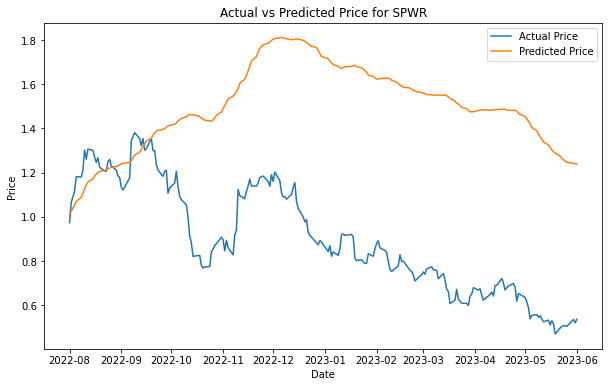

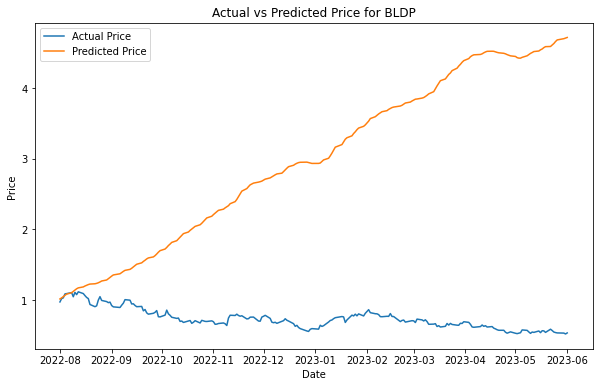

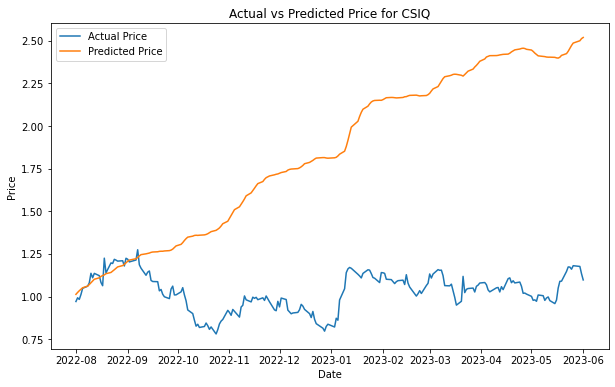

In [215]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')


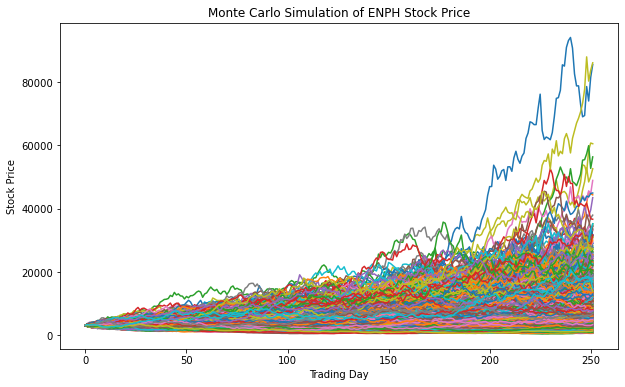

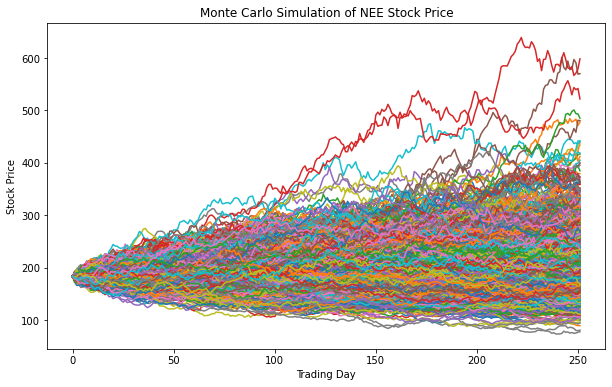

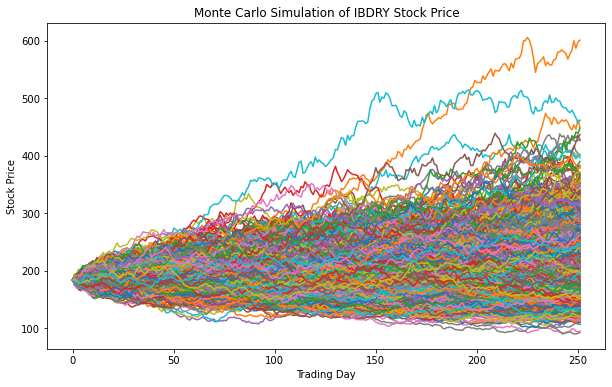

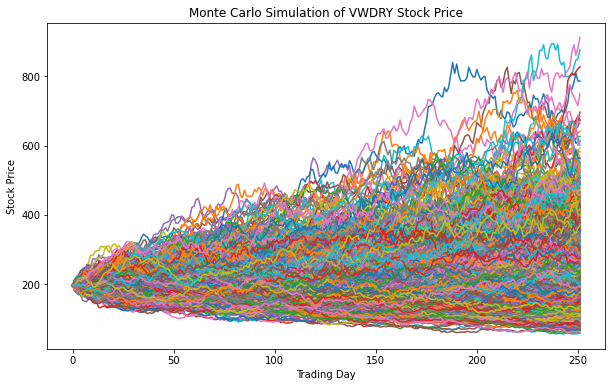

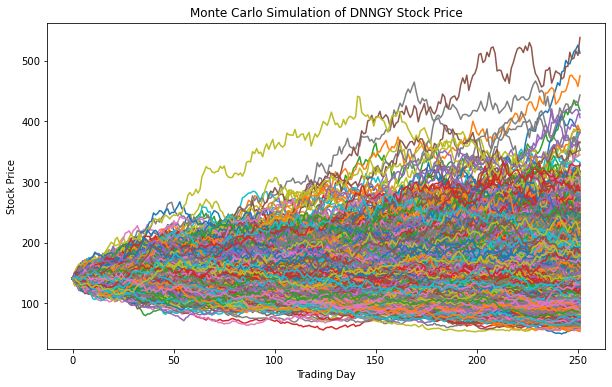

...

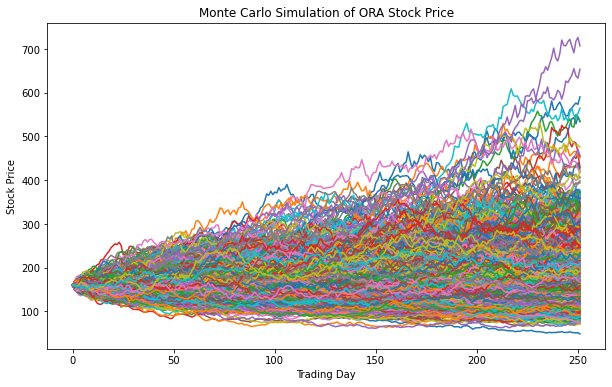

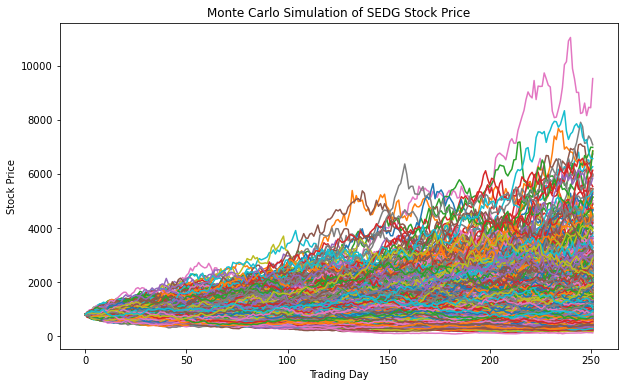

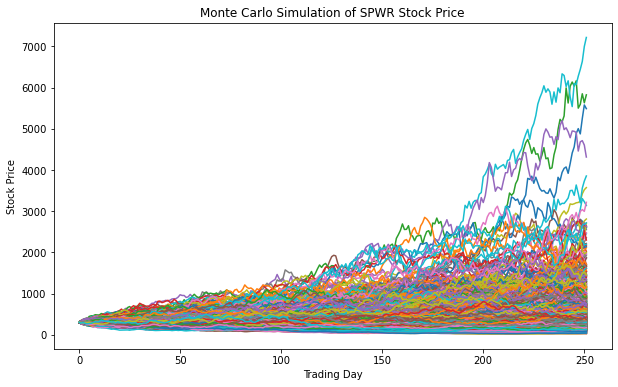

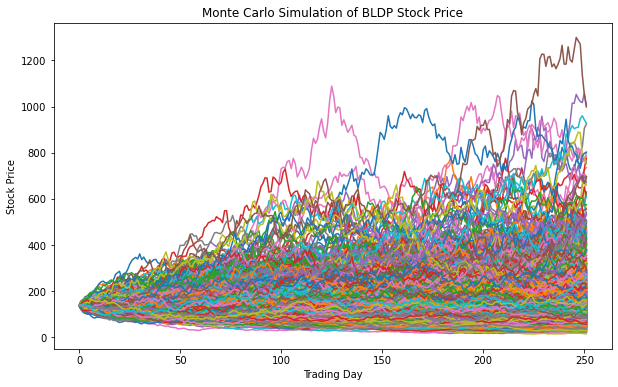

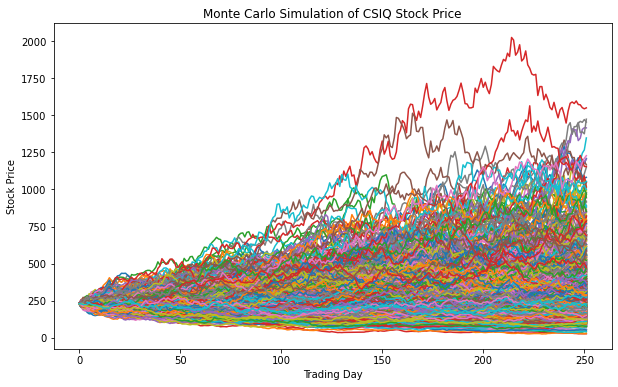

In [202]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
num_simulations = 1000
num_trading_days = 252

# Unique tickers
tickers = merged_df['Ticker'].unique()

start_price = 100  # Arbitrary chosen starting price

for ticker in tickers:
    # Get the returns of the ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker]['Return']

    # Calculate the mean and standard deviation of the returns
    mean_returns = ticker_returns.mean()
    std_returns = ticker_returns.std()

    # Calculate an approximate close price for the stock
    close_price = start_price * (1 + ticker_returns).cumprod().iloc[-1]

    # Create a list to hold the simulation results
    simulation_list = []

    for n in range(num_simulations):
        # Generate the random returns for the trading days
        daily_returns = np.random.normal(mean_returns, std_returns, num_trading_days) + 1

        # Calculate the price series
        price_series = [close_price]

        for i in range(1, num_trading_days):
            price_series.append(price_series[-1] * daily_returns[i])

        # Add the simulation to the list
        simulation_list.append(pd.DataFrame(price_series, columns=[n]))

    # Concatenate all simulations into a DataFrame
    ticker_simulations = pd.concat(simulation_list, axis=1)

    # Plot the simulation results
    plt.figure(figsize=(10, 6))
    plt.plot(ticker_simulations)
    plt.title(f'Monte Carlo Simulation of {ticker} Stock Price')
    plt.xlabel('Trading Day')
    plt.ylabel('Stock Price')
    plt.show()


In [218]:
features_dict = {
    "BE": [],
    "BLDP": [],
    "CSIQ": [],
    "DNNGY": [],
    "ENPH": [],
    "FSLR": [],
    "IBDRY": [],
    "NEE": [],
    "ORA": [],
    "PLUG": [],
    "RUN": [],
    "SEDG": [],
    "SPWR": [],
    "VWDRY": []
}

In [219]:
from keras.layers import Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Hyperparameters
n_units = 50  # number of LSTM units
dropout_rate = 0.2  # dropout rate
validation_split = 0.2  # fraction of data to be used as validation

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=n_units, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    model_checkpoint = ModelCheckpoint(f'{ticker}_best_model.h5', save_best_only=True, monitor='val_loss')

    # Fit the model
    model.fit(
        x_train, y_train,
        validation_split=validation_split,
        epochs=20,
        batch_size=32,
        callbacks=[early_stopping, model_checkpoint],
        verbose=0
    )

    # Load the best model
    model.load_weights(f'{ticker}_best_model.h5')

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 11ms/step
MSE for ENPH: 0.0014679301148777949


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 6ms/step
MSE for NEE: 0.0002821693217223228


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 6ms/step
MSE for IBDRY: 0.0001768083339284364


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 5ms/step
MSE for VWDRY: 0.000748849771537915


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 4s 7ms/step
MSE for DNNGY: 0.0006540356364261744


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 10ms/step
MSE for FSLR: 0.0012690327441302117


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 4ms/step
MSE for RUN: 0.002674224379910299


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 6ms/step
MSE for PLUG: 0.0020870192570998946


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for BE: 0.0017790404332460688


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for ORA: 0.00041147050945412227


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for SEDG: 0.0016500966122410712


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for SPWR: 0.0016518824220163857


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for BLDP: 0.0016344487100846705


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 8ms/step
MSE for CSIQ: 0.0012563092616676046


In [221]:
features_dict = {
    "BE": ["NASDAQ_Close"],
    "BLDP": ["NASDAQ_Close"],
    "CSIQ": ["NASDAQ_Close"],
    "DNNGY": ["NASDAQ_Close"],
    "ENPH": ["NASDAQ_Close"],
    "FSLR": ["NASDAQ_Close"],
    "IBDRY": ["NASDAQ_Close"],
    "NEE": ["NASDAQ_Close"],
    "ORA": ["NASDAQ_Close"],
    "PLUG": ["NASDAQ_Close"],
    "RUN": ["NASDAQ_Close"],
    "SEDG": ["NASDAQ_Close"],
    "SPWR": ["NASDAQ_Close"],
    "VWDRY": ["NASDAQ_Close"]
}

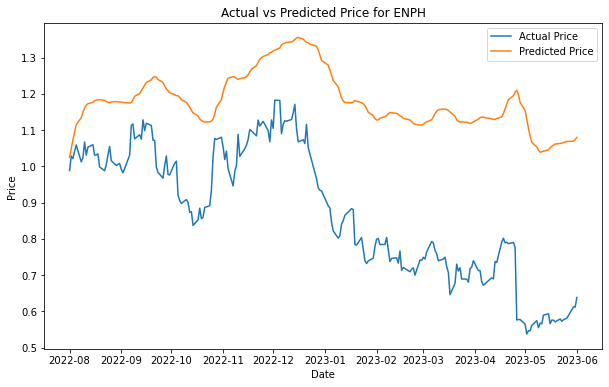

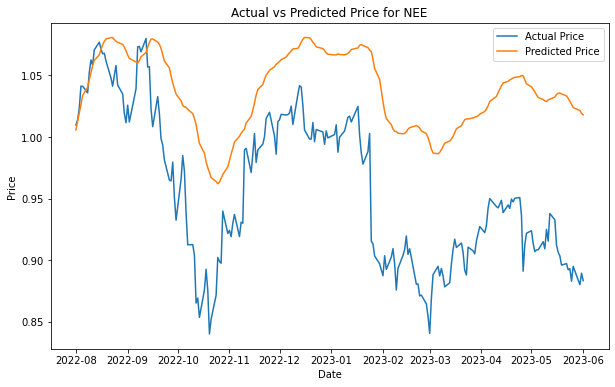

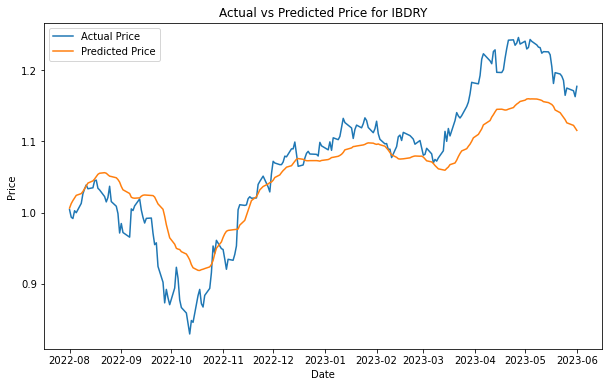

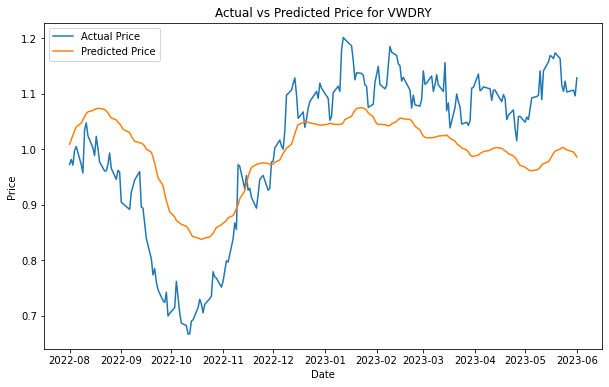

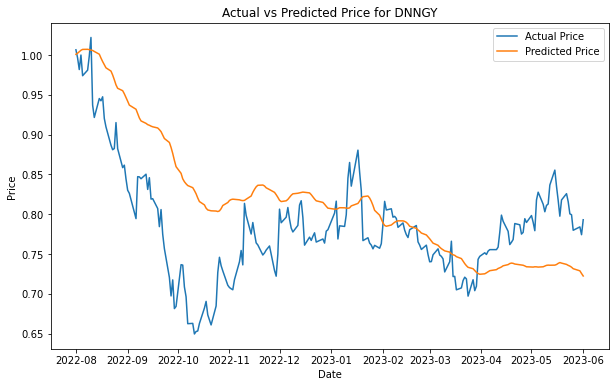

...

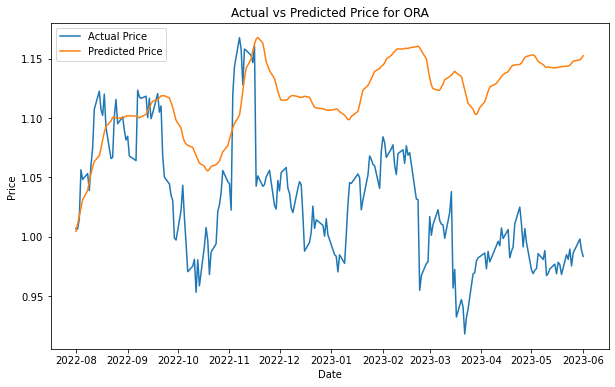

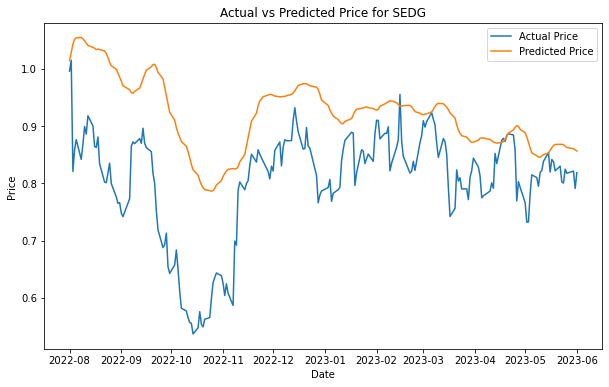

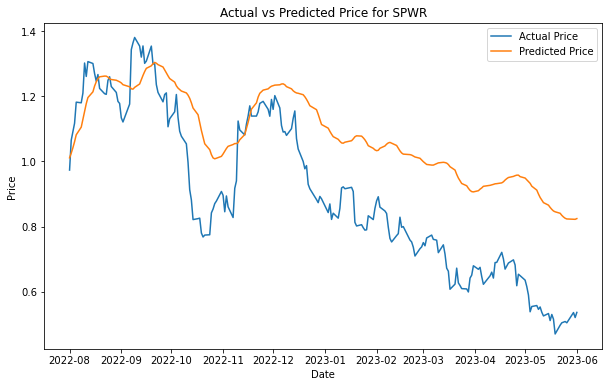

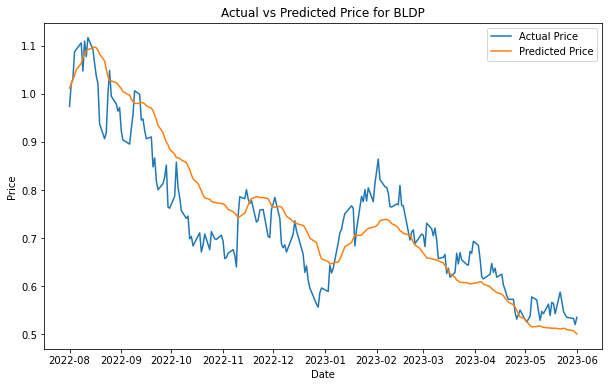

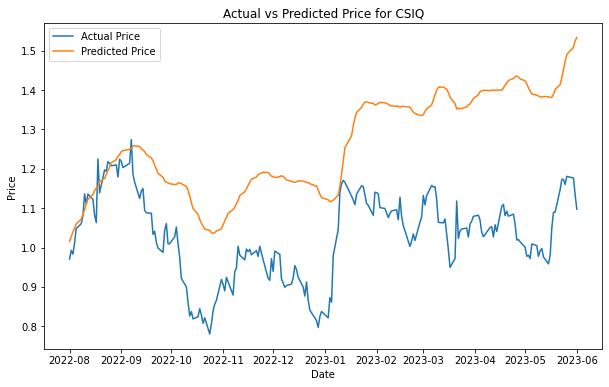

In [220]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')


In [222]:
from keras.layers import Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Hyperparameters
n_units = 50  # number of LSTM units
dropout_rate = 0.2  # dropout rate
validation_split = 0.2  # fraction of data to be used as validation

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=n_units, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    model_checkpoint = ModelCheckpoint(f'{ticker}_best_model.h5', save_best_only=True, monitor='val_loss')

    # Fit the model
    model.fit(
        x_train, y_train,
        validation_split=validation_split,
        epochs=20,
        batch_size=32,
        callbacks=[early_stopping, model_checkpoint],
        verbose=0
    )

    # Load the best model
    model.load_weights(f'{ticker}_best_model.h5')

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for ENPH: 0.0014384809462200583


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 7ms/step
MSE for NEE: 0.00028423207485954785


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 9ms/step
MSE for IBDRY: 0.00017551080034983833


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for VWDRY: 0.0007524989165488623


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for DNNGY: 0.0006514057173694843


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 7ms/step
MSE for FSLR: 0.0012787152821116385


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 5ms/step
MSE for RUN: 0.0025831560762647893


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for PLUG: 0.00208252238379842


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for BE: 0.0017514919786230123


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 5ms/step
MSE for ORA: 0.00040874099312398024


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 8ms/step
MSE for SEDG: 0.001643052642669328


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 15ms/step
MSE for SPWR: 0.0016428048344283262


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 9ms/step
MSE for BLDP: 0.0016030431197679564


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 9ms/step
MSE for CSIQ: 0.0012468346375849437


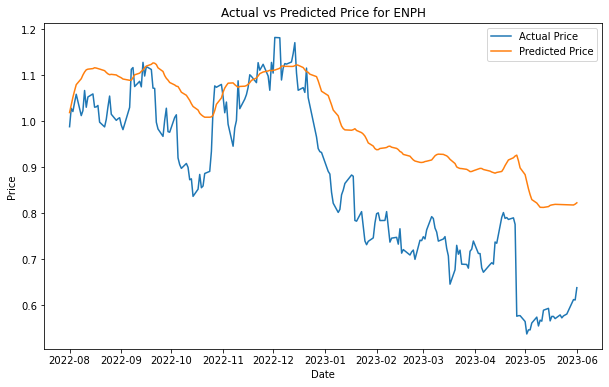

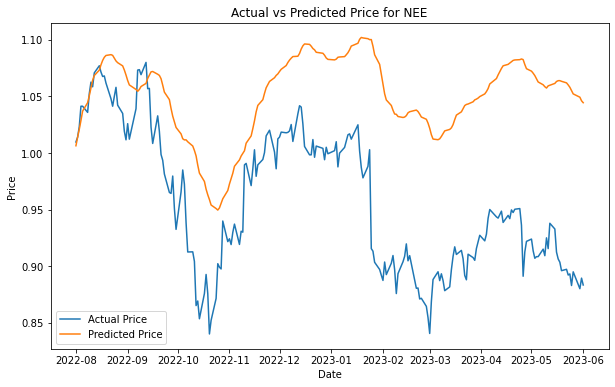

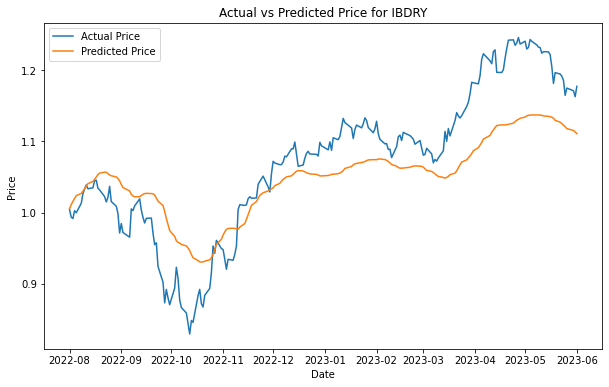

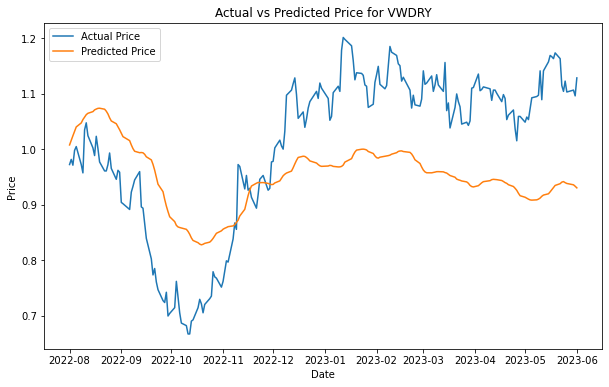

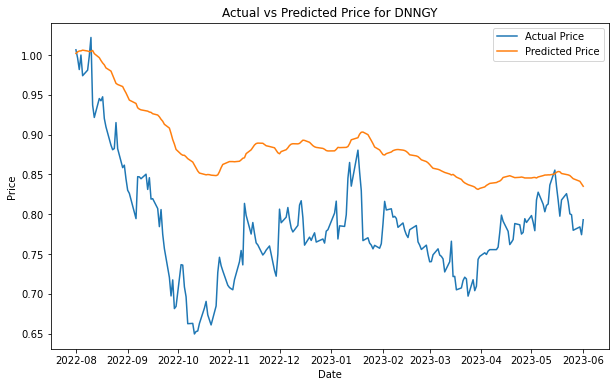

...

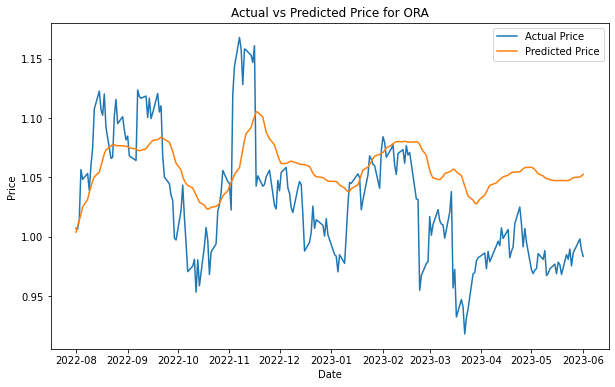

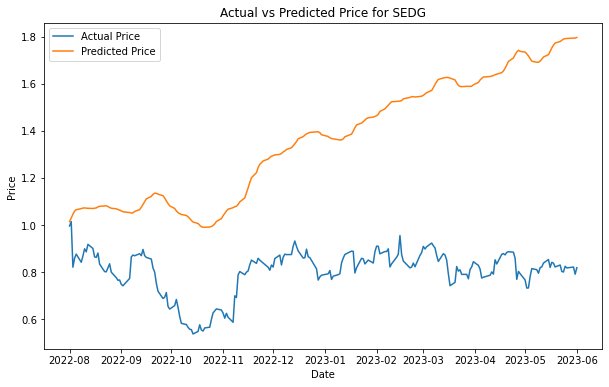

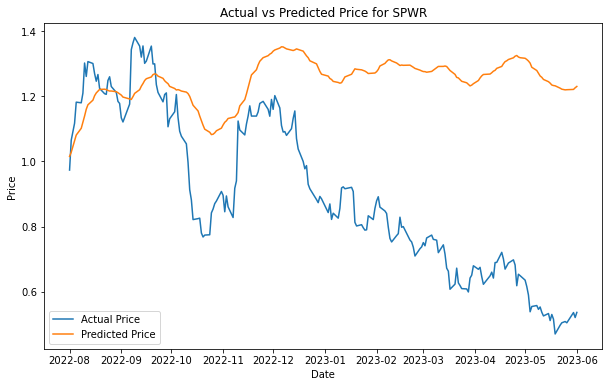

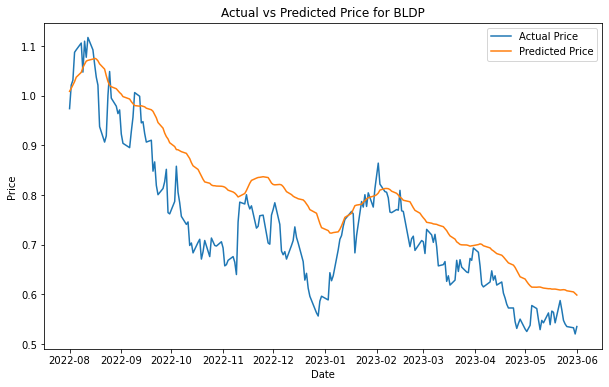

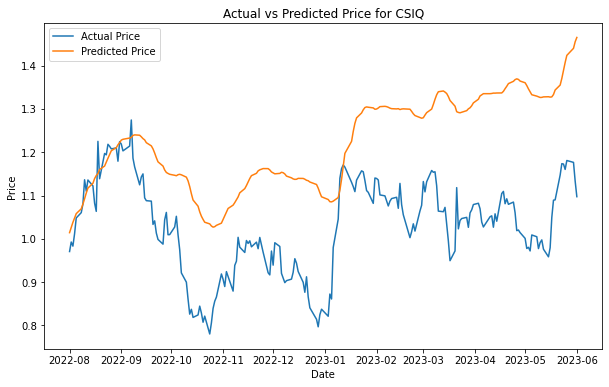

In [223]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

In [262]:
features_dict = {
    "BE": [],
    "BLDP": ["NASDAQ_Close"],
    "CSIQ": ["NASDAQ_Close"],
    "DNNGY": [],
    "ENPH": ["NASDAQ_Close"],
    "FSLR": [],
    "IBDRY": ["NASDAQ_Close"],
    "NEE": ["NASDAQ_Close"],
    "ORA": ["NASDAQ_Close"],
    "PLUG": ["NASDAQ_Close"],
    "RUN": ["NASDAQ_Close"],
    "SEDG": [],
    "SPWR": [],
    "VWDRY": ["VIX_CLOSE"]
}

In [291]:
from keras.layers import Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Hyperparameters
n_units = 50  # number of LSTM units
dropout_rate = 0.2  # dropout rate
validation_split = 0.2  # fraction of data to be used as validation

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

mse_dict = {}  # A dictionary to store MSE of each ticker

# For each ticker
for ticker in tickers:
    # Select the specific features for each ticker
    features = features_dict[ticker]

    # Get returns of current ticker
    ticker_returns = merged_df[merged_df['Ticker'] == ticker][['Date', 'Return'] + features]
    ticker_returns.set_index('Date', inplace=True)

    # Split the data into training and test sets
    train_size = int(train_size_frac * len(ticker_returns))
    train_df = ticker_returns.iloc[:train_size]
    test_df = ticker_returns.iloc[train_size:]

    # Normalize the returns
    scaler = MinMaxScaler(feature_range=(0, 1))
    return_scaler = MinMaxScaler(feature_range=(0, 1))  # separate scaler for returns
    scaled_train = scaler.fit_transform(train_df)
    scaled_test = scaler.transform(test_df)
    scaled_train_returns = return_scaler.fit_transform(train_df[['Return']])
    scaled_test_returns = return_scaler.transform(test_df[['Return']])

    inputs, outputs, test_inputs, test_outputs = [], [], [], []

    # Prepare training data
    for i in range(lookback, len(scaled_train)):
        inputs.append(scaled_train[i-lookback:i])
        outputs.append(scaled_train_returns[i][0])  # use return_scaler for outputs

    # Prepare test data
    for i in range(lookback, len(scaled_test)):
        test_inputs.append(scaled_test[i-lookback:i])
        test_outputs.append(scaled_test_returns[i][0])  # use return_scaler for test outputs

    # Convert inputs and outputs to numpy arrays
    x_train = np.array(inputs)
    y_train = np.array(outputs)
    x_test = np.array(test_inputs)
    y_test = np.array(test_outputs)

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=n_units, activation='tanh', input_shape=(lookback, len(features)+1), return_sequences=False))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    model_checkpoint = ModelCheckpoint(f'{ticker}_best_model.h5', save_best_only=True, monitor='val_loss')

    # Fit the model
    model.fit(
        x_train, y_train,
        validation_split=validation_split,
        epochs=20,
        batch_size=32,
        callbacks=[early_stopping, model_checkpoint],
        verbose=0
    )

    # Load the best model
    model.load_weights(f'{ticker}_best_model.h5')

    # Make predictions
    predictions = model.predict(x_test)

    # Inverse transform the predictions and actual values
    predictions = return_scaler.inverse_transform(predictions)  # use return_scaler for inverse transform
    y_test = return_scaler.inverse_transform(y_test.reshape(-1, 1))  # use return_scaler for inverse transform

    # Compute MSE
    mse = mean_squared_error(y_test, predictions)
    mse_dict[ticker] = mse

    # Store the actual and predicted values for this ticker
    actual_df = pd.DataFrame(y_test, columns=[ticker])
    actual_df.index = test_df.index[lookback:]  # assign the index from test_df
    actual_df.index.name = 'Date'  # assign the index name as 'Date'
    actual_df.to_csv(f'{ticker}_actual.csv')

    predicted_df = pd.DataFrame(predictions, columns=[ticker])
    predicted_df.index = test_df.index[lookback:]  # assign the index from test_df
    predicted_df.index.name = 'Date'  # assign the index name as 'Date'
    predicted_df.to_csv(f'{ticker}_predicted.csv')

    print(f'MSE for {ticker}: {mse}')

C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 5ms/step
MSE for ENPH: 0.0014664115887117074


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for NEE: 0.0002777733245314257


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 7ms/step
MSE for IBDRY: 0.00017900557614853457


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 5ms/step
MSE for VWDRY: 0.000749588215770278


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for DNNGY: 0.0006545343050895228


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 5ms/step
MSE for FSLR: 0.0012599897077327227


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for RUN: 0.002603656427520715


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 3ms/step
MSE for PLUG: 0.00208117443316338


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 5ms/step
MSE for BE: 0.0017729229417037633


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 5ms/step
MSE for ORA: 0.00041610291983443487


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 6ms/step
MSE for SEDG: 0.0016700017251520495


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 4ms/step
MSE for SPWR: 0.001649762474199774


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 5ms/step
MSE for BLDP: 0.0016425882778703367


C:\Users\subhan\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 7ms/step
MSE for CSIQ: 0.0012671751748371289


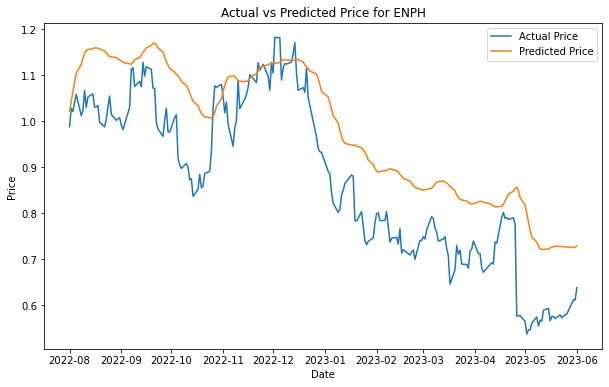

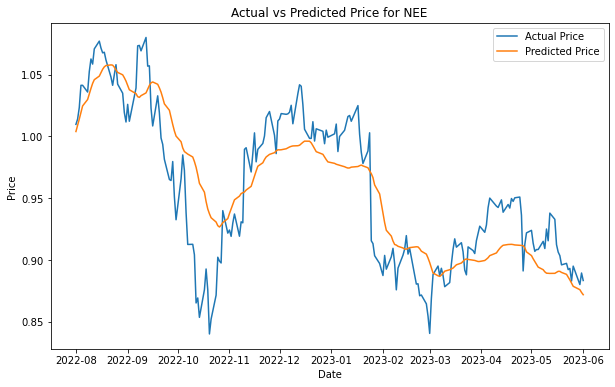

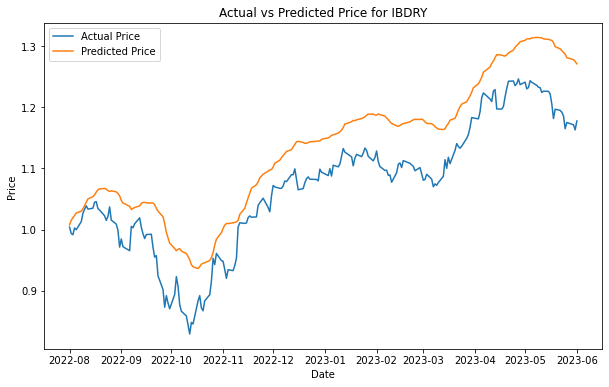

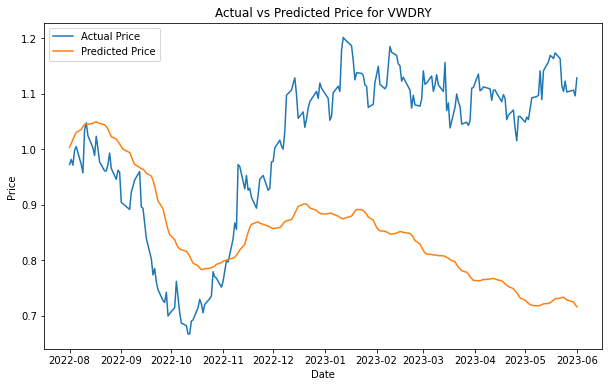

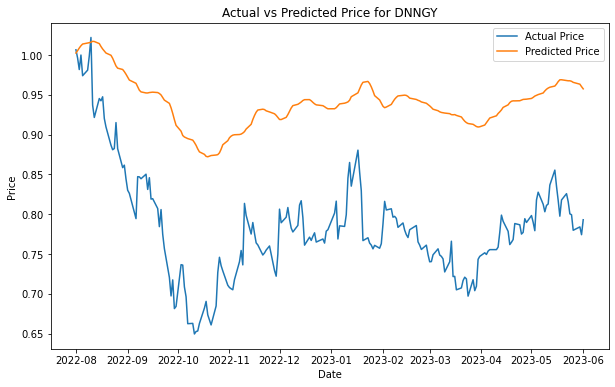

...

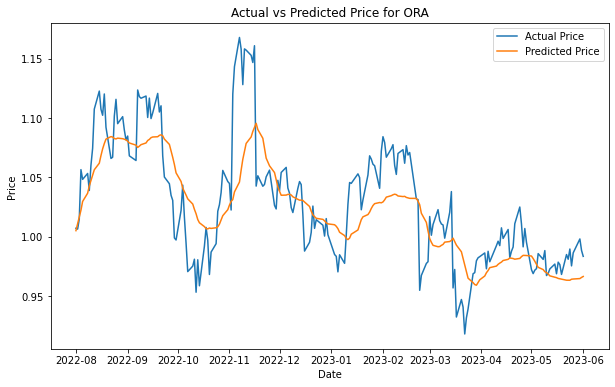

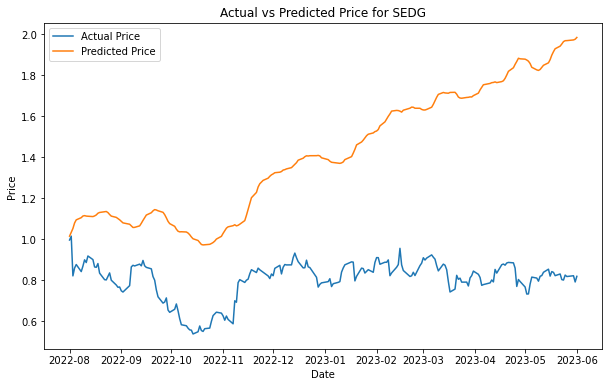

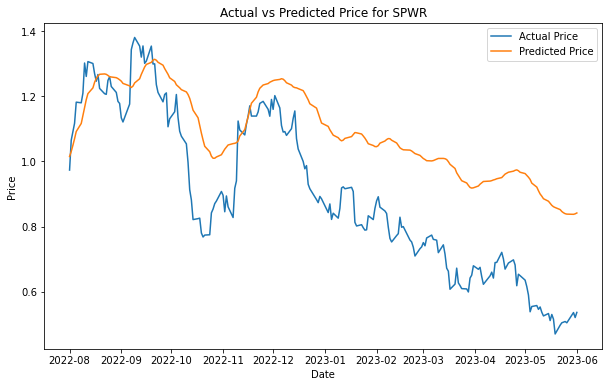

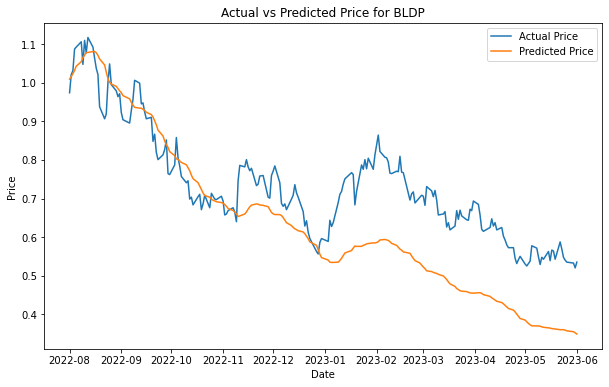

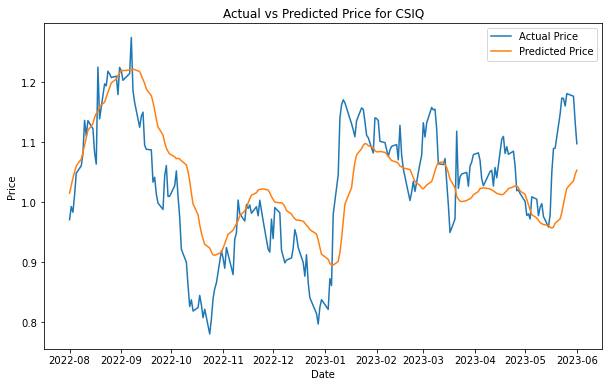

In [292]:
plot_predictions2('ENPH')
plot_predictions2('NEE')
plot_predictions2('IBDRY')
plot_predictions2('VWDRY')
plot_predictions2('DNNGY')
plot_predictions2('FSLR')
plot_predictions2('RUN')
plot_predictions2('PLUG')
plot_predictions2('BE')
plot_predictions2('ORA')
plot_predictions2('SEDG')
plot_predictions2('SPWR')
plot_predictions2('BLDP')
plot_predictions2('CSIQ')

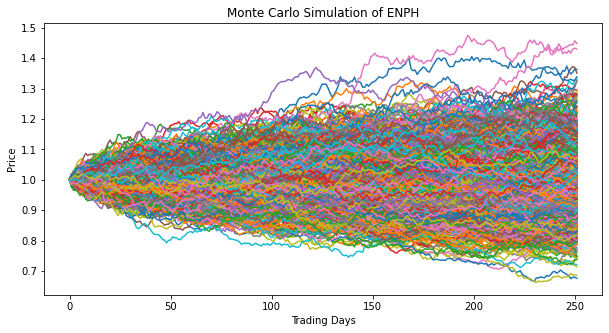

In [315]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Get the unique tickers
tickers = merged_df['Ticker'].unique()

# Prepare to store Monte Carlo simulations
simulation_data = {}

# Prepare to store last prices
last_prices = {}

# Start Monte Carlo simulation
for ticker in tickers:
    # Load the predicted returns
    predicted_df = pd.read_csv(f'{ticker}_predicted.csv')
    predicted_returns = predicted_df[ticker].values

    # Calculate the mean and standard deviation of predicted returns
    mean = predicted_returns.mean()
    volatility = predicted_returns.std()

    # Monte Carlo settings
    num_simulations = 1000
    num_trading_days = 252

    # Last price (here we assume 1 for simplicity)
    last_prices[ticker] = 1

    # Prepare to store simulations for current ticker
    ticker_simulations = []

    for x in range(num_simulations):
        count = 0

        # Price array
        price_series = []

        # Append start price
        price_series.append(last_prices[ticker])

        # Series for further price (random walk)
        for y in range(num_trading_days):
            if count == 251:
                break
            price = price_series[count] * (1 + np.random.normal(0, volatility))
            price_series.append(price)
            count += 1

        ticker_simulations.append(price_series)

    # Add ticker simulations to overall simulation data
    simulation_data[ticker] = ticker_simulations

# Convert the dictionary to a DataFrame
simulation_df = pd.DataFrame(simulation_data)

# Plotting the first stock's simulations
plt.figure(figsize=(10,5))
for simulation in simulation_df['ENPH']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of ENPH')
plt.show()


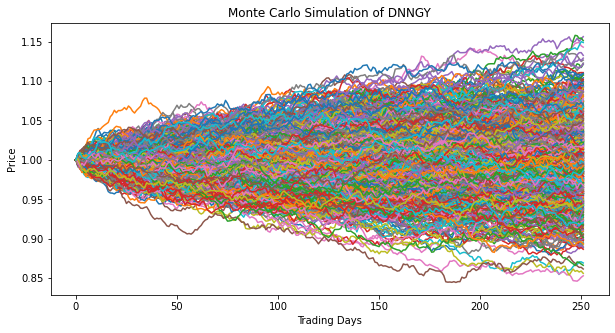

In [318]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['DNNGY']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of DNNGY')
plt.show()


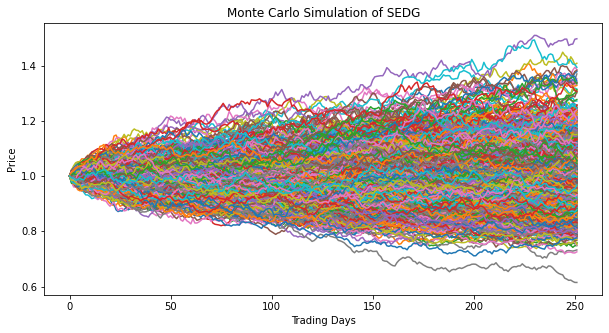

In [319]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['SEDG']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of SEDG')
plt.show()


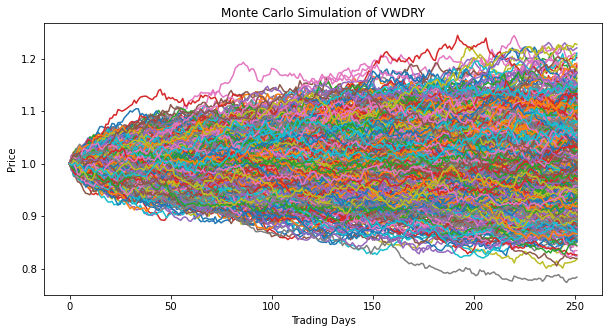

In [321]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['VWDRY']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of VWDRY')
plt.show()


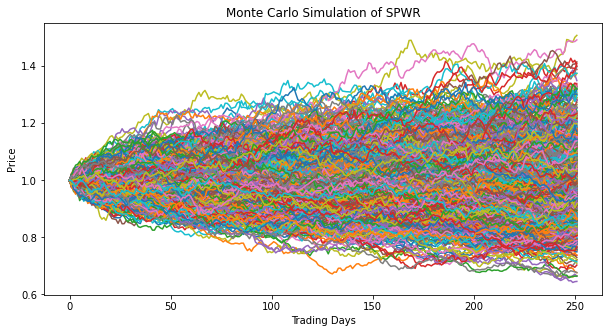

In [322]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['SPWR']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of SPWR')
plt.show()


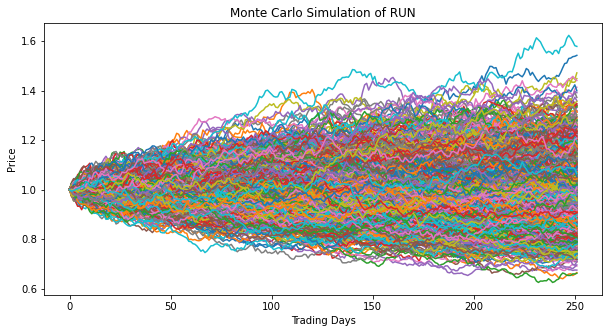

In [323]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['RUN']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of RUN')
plt.show()


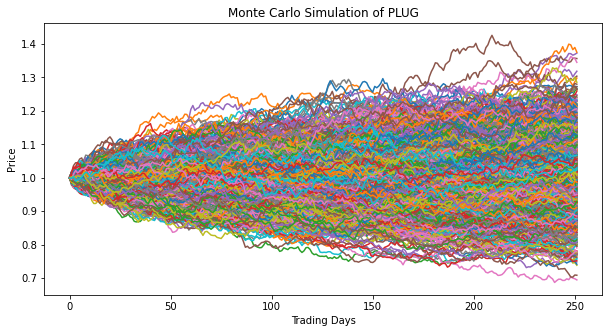

In [324]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['PLUG']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of PLUG')
plt.show()


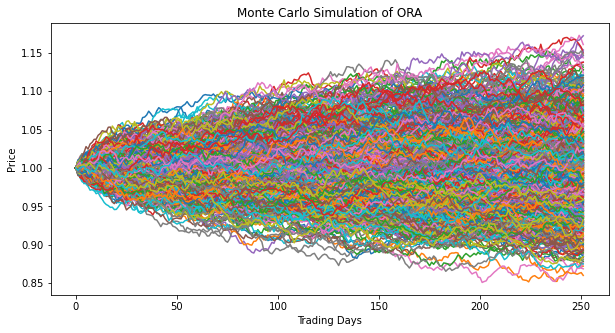

In [325]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['ORA']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of ORA')
plt.show()


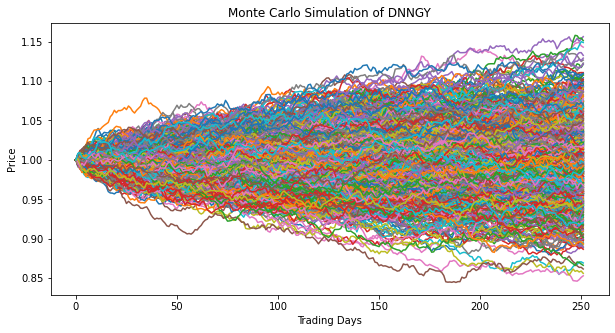

In [326]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['DNNGY']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of DNNGY')
plt.show()


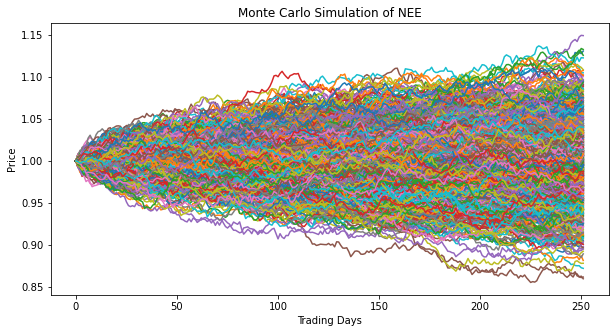

In [327]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['NEE']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of NEE')
plt.show()


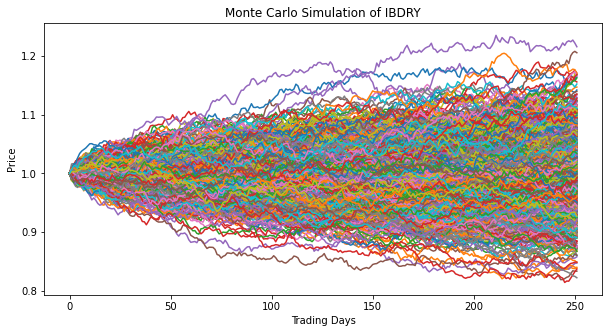

In [328]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['IBDRY']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of IBDRY')
plt.show()


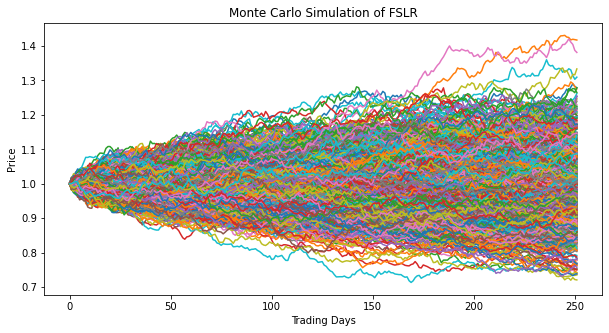

In [329]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['FSLR']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of FSLR')
plt.show()


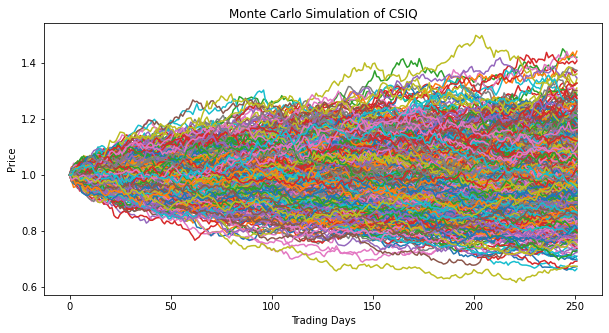

In [330]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['CSIQ']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of CSIQ')
plt.show()


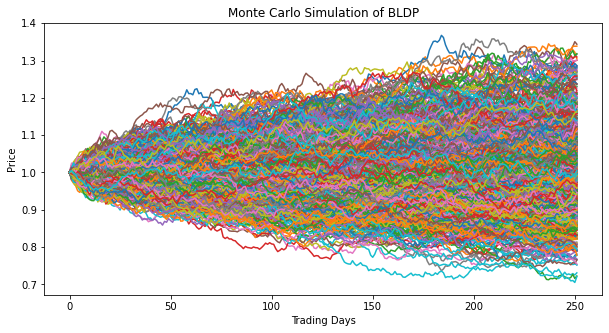

In [331]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['BLDP']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of BLDP')
plt.show()


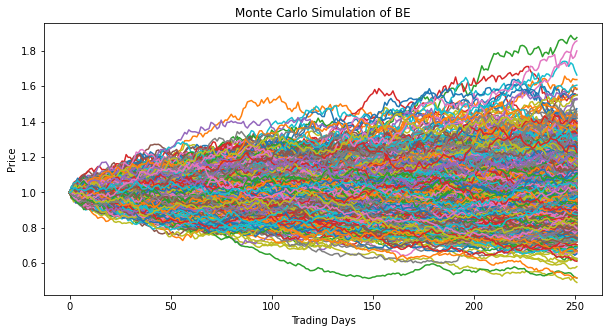

In [332]:
plt.figure(figsize=(10,5))
for simulation in simulation_df['BE']:
    plt.plot(simulation)
plt.ylabel('Price')
plt.xlabel('Trading Days')
plt.title('Monte Carlo Simulation of BE')
plt.show()
